<a href="https://colab.research.google.com/github/kashish1203/minecrafters/blob/main/GradeintDescent_and_SGD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df=pd.read_csv('/content/MetroPT3(AirCompressor).csv')

In [ ]:
df

,Unnamed: 0,timestamp,TP2,TP3,H1,DV_pressure,Reservoirs,Oil_temperature,Motor_current,COMP,DV_eletric,Towers,MPG,LPS,Pressure_switch,Oil_level,Caudal_impulses
0,0,2020-02-01 00:00:00,-0.012,9.358,9.340,-0.024,9.358,53.600,0.0400,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
1,10,2020-02-01 00:00:10,-0.014,9.348,9.332,-0.022,9.348,53.675,0.0400,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
2,20,2020-02-01 00:00:19,-0.012,9.338,9.322,-0.022,9.338,53.600,0.0425,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
3,30,2020-02-01 00:00:29,-0.012,9.328,9.312,-0.022,9.328,53.425,0.0400,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
4,40,2020-02-01 00:00:39,-0.012,9.318,9.302,-0.022,9.318,53.475,0.0400,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130114,1301140,2020-02-18 05:09:12,-0.012,8.914,8.902,-0.020,8.916,53.050,0.0400,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
130115,1301150,2020-02-18 05:09:22,-0.012,8.912,8.898,-0.022,8.914,53.025,0.0375,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
130116,1301160,2020-02-18 05:09:32,-0.012,8.908,8.894,-0.022,8.910,53.000,0.0375,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
130117,1301170,2020-02-18 05:09:42,-0.012,8.904,8.888,-0.022,8.904,52.850,0.0375,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0


In [ ]:
df.describe()

,Unnamed: 0,TP2,TP3,H1,DV_pressure,Reservoirs,Oil_temperature,Motor_current,COMP,DV_eletric,Towers,MPG,LPS,Pressure_switch,Oil_level,Caudal_impulses
count,21798.000000,21798.000000,21798.000000,21798.000000,21798.000000,21797.000000,21797.000000,21797.000000,21797.000000,21797.000000,21797.000000,21797.000000,21797.0,21797.000000,21797.0,21797.0
mean,108985.000000,0.527580,8.966398,8.412387,-0.018102,8.968871,56.020245,1.271986,0.940313,0.059687,0.970179,0.940313,0.0,0.999495,1.0,1.0
std,62926.849198,2.180088,0.557479,2.184408,0.050722,0.556751,2.929287,1.984806,0.236912,0.236912,0.170096,0.236912,0.0,0.022459,0.0,0.0
min,0.000000,-0.030000,7.588000,-0.030000,-0.026000,7.596000,31.975000,0.030000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.0,1.0
25%,54492.500000,-0.014000,8.486000,8.386000,-0.020000,8.488000,54.575000,0.037500,1.000000,0.000000,1.000000,1.000000,0.0,1.000000,1.0,1.0
50%,108985.000000,-0.012000,8.940000,8.860000,-0.020000,8.942000,56.425000,0.037500,1.000000,0.000000,1.000000,1.000000,0.0,1.000000,1.0,1.0
75%,163477.500000,-0.010000,9.428000,9.368000,-0.018000,9.430000,57.875000,3.755000,1.000000,0.000000,1.000000,1.000000,0.0,1.000000,1.0,1.0
max,217970.000000,10.532000,10.156000,10.152000,4.688000,10.158000,64.075000,7.357500,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.0,1.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21798 entries, 0 to 21797
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       21798 non-null  int64  
 1   timestamp        21798 non-null  object 
 2   TP2              21798 non-null  float64
 3   TP3              21798 non-null  float64
 4   H1               21798 non-null  float64
 5   DV_pressure      21798 non-null  float64
 6   Reservoirs       21797 non-null  float64
 7   Oil_temperature  21797 non-null  float64
 8   Motor_current    21797 non-null  float64
 9   COMP             21797 non-null  float64
 10  DV_eletric       21797 non-null  float64
 11  Towers           21797 non-null  float64
 12  MPG              21797 non-null  float64
 13  LPS              21797 non-null  float64
 14  Pressure_switch  21797 non-null  float64
 15  Oil_level        21797 non-null  float64
 16  Caudal_impulses  21797 non-null  float64
dtypes: float64(1

In [ ]:
print(df.isnull().sum())

Unnamed: 0         0
timestamp          0
TP2                0
TP3                0
H1                 0
DV_pressure        0
Reservoirs         1
Oil_temperature    1
Motor_current      1
COMP               1
DV_eletric         1
Towers             1
MPG                1
LPS                1
Pressure_switch    1
Oil_level          1
Caudal_impulses    1
dtype: int64


In [ ]:
df.columns

Index(['Unnamed: 0', 'timestamp', 'TP2', 'TP3', 'H1', 'DV_pressure',
       'Reservoirs', 'Oil_temperature', 'Motor_current', 'COMP', 'DV_eletric',
       'Towers', 'MPG', 'LPS', 'Pressure_switch', 'Oil_level',
       'Caudal_impulses'],
      dtype='object')

In [ ]:
df['timestamp'] = pd.to_datetime(df['timestamp'])

<function matplotlib.pyplot.show(close=None, block=None)>

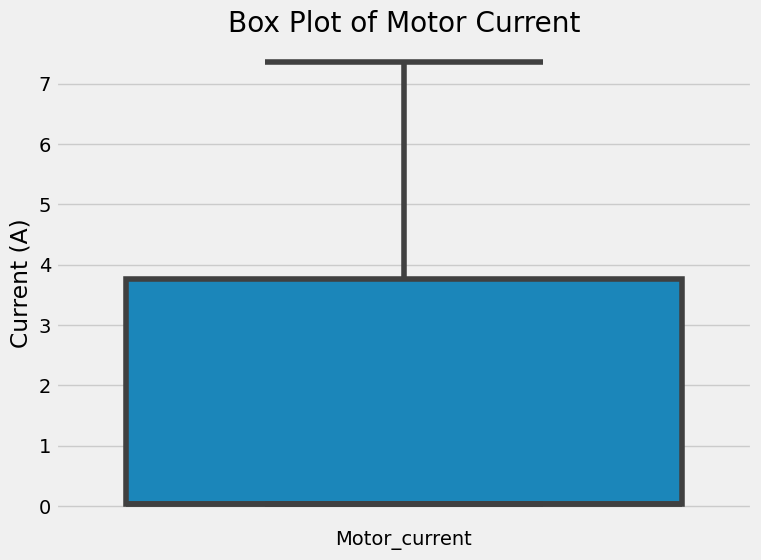

In [ ]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df[['Motor_current']])
plt.title('Box Plot of Motor Current')
plt.ylabel('Current (A)')
plt.show

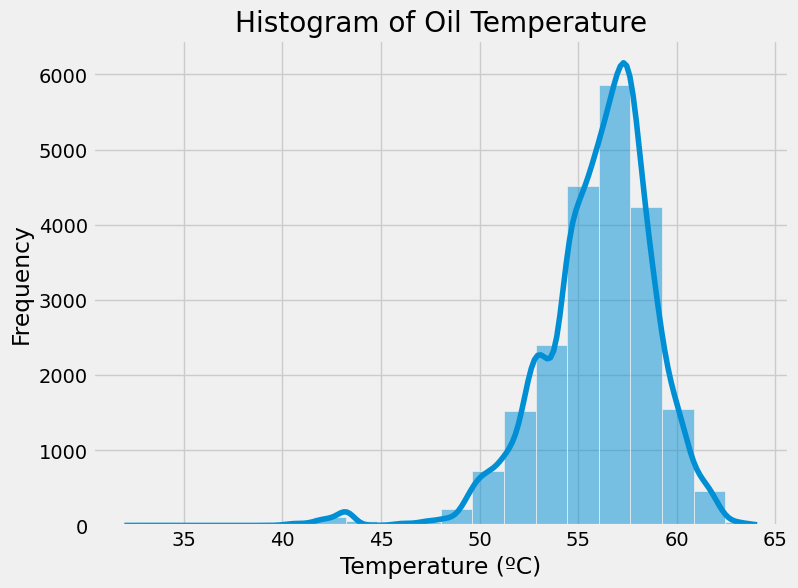

In [ ]:
plt.figure(figsize=(8, 6))
sns.histplot(data=df, x='Oil_temperature', bins=20, kde=True)
plt.title('Histogram of Oil Temperature')
plt.xlabel('Temperature (ºC)')
plt.ylabel('Frequency')
plt.show()

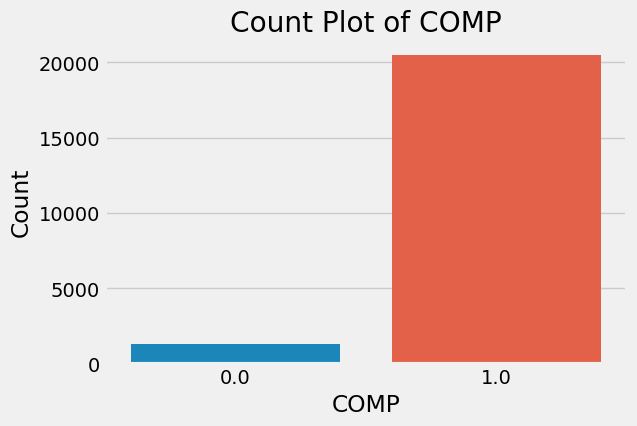

In [ ]:
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='COMP')
plt.title('Count Plot of COMP')
plt.xlabel('COMP')
plt.ylabel('Count')
plt.show()

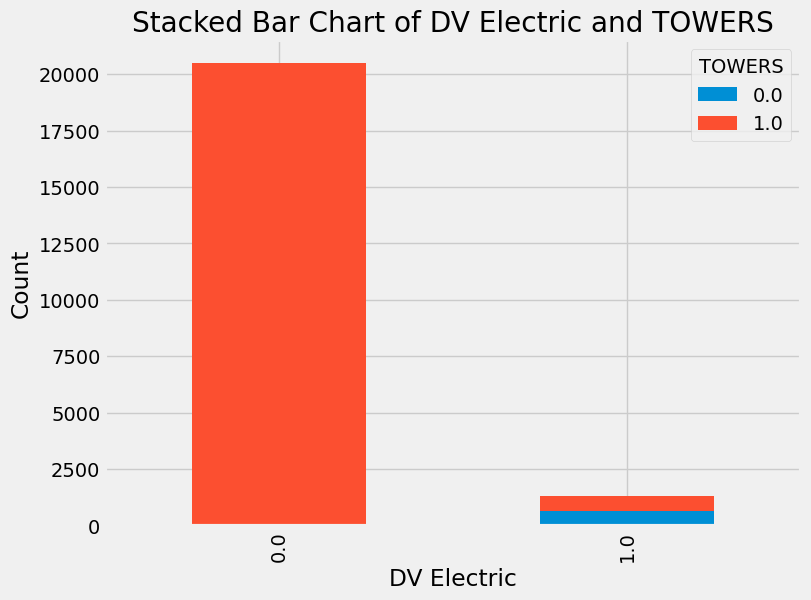

In [ ]:
stacked_df = df[['DV_eletric', 'Towers']].groupby(['DV_eletric', 'Towers']).size().unstack()
stacked_df.plot(kind='bar', stacked=True, figsize=(8, 6))
plt.title('Stacked Bar Chart of DV Electric and TOWERS')
plt.xlabel('DV Electric')
plt.ylabel('Count')
plt.legend(title='TOWERS')
plt.show()

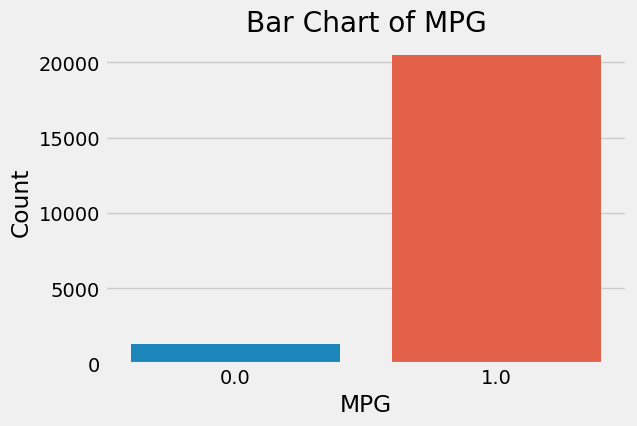

In [ ]:
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='MPG')
plt.title('Bar Chart of MPG')
plt.xlabel('MPG')
plt.ylabel('Count')
plt.show()

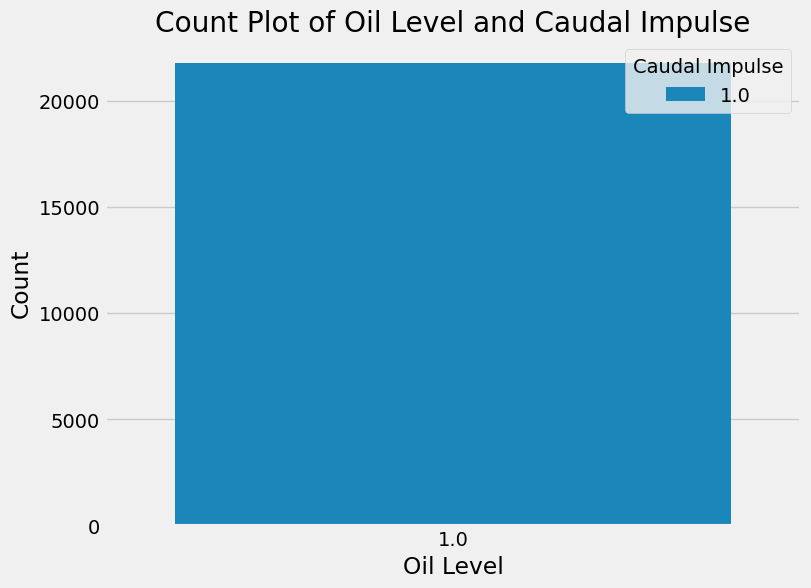

In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Oil_level', hue='Caudal_impulses')
plt.title('Count Plot of Oil Level and Caudal Impulse')
plt.xlabel('Oil Level')
plt.ylabel('Count')
plt.legend(title='Caudal Impulse')
plt.show()

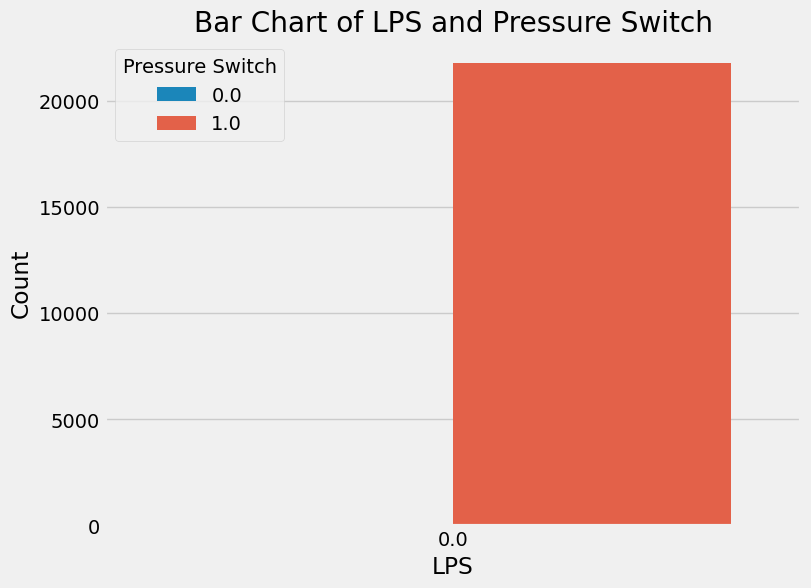

In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='LPS', hue='Pressure_switch')
plt.title('Bar Chart of LPS and Pressure Switch')
plt.xlabel('LPS')
plt.ylabel('Count')
plt.legend(title='Pressure Switch')
plt.show()

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

TypeError: ignored

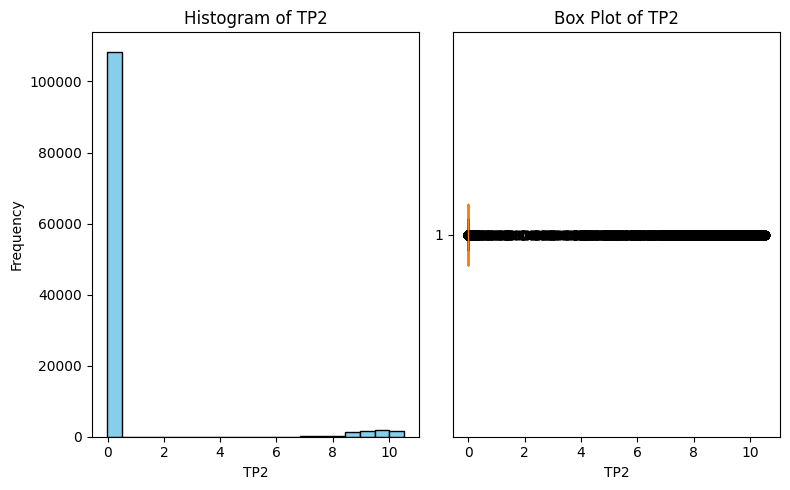

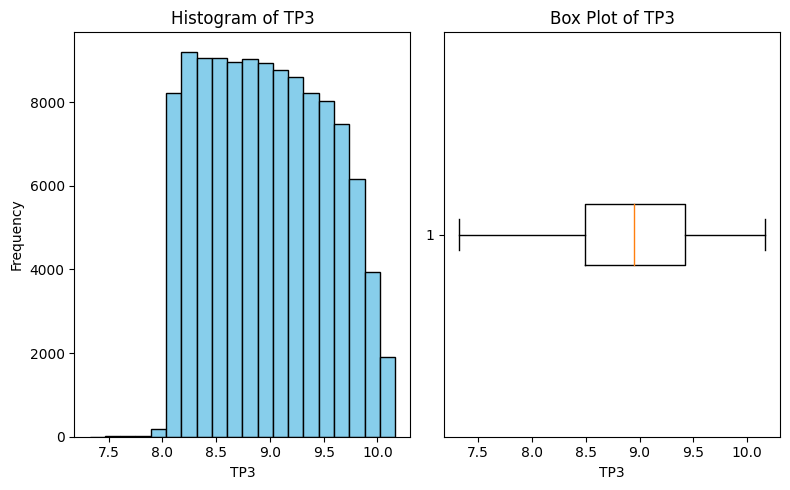

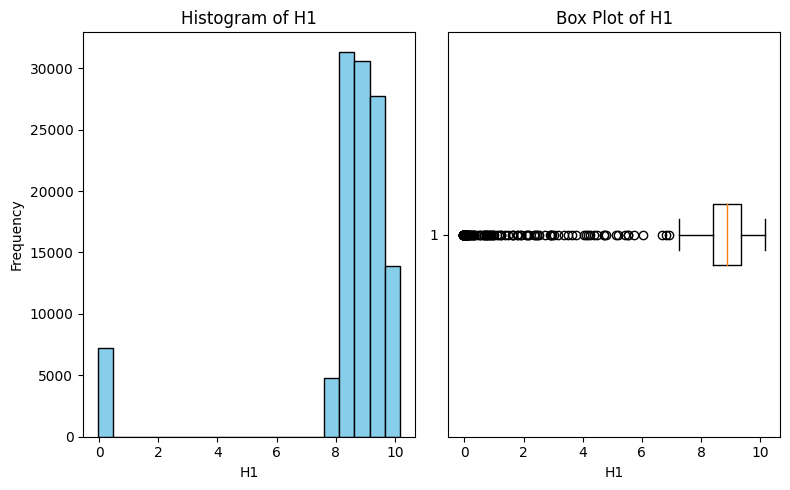

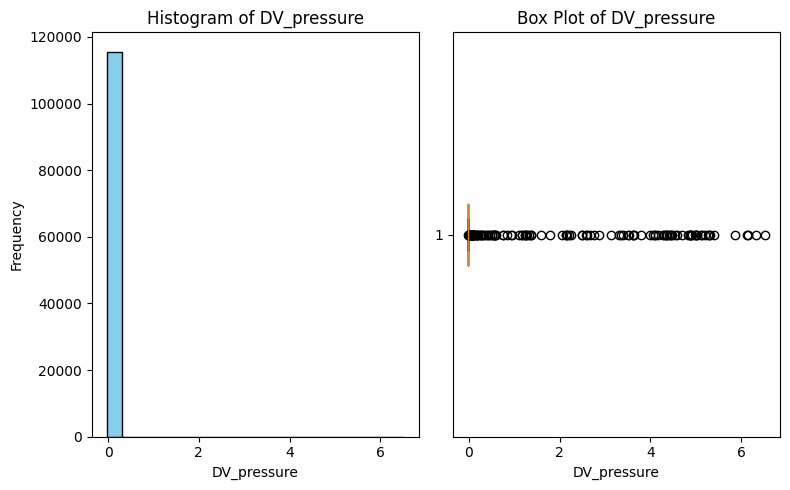

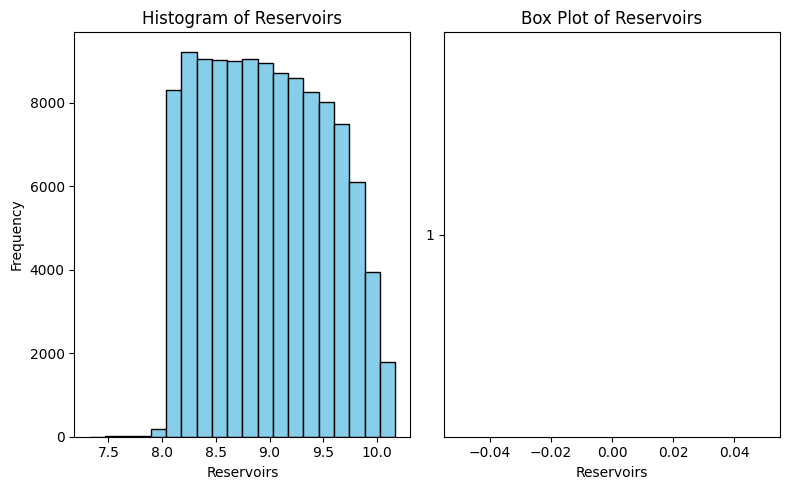

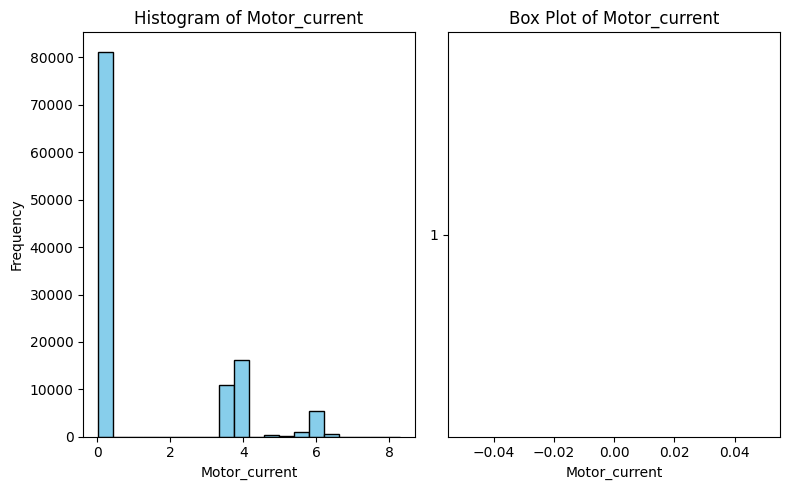

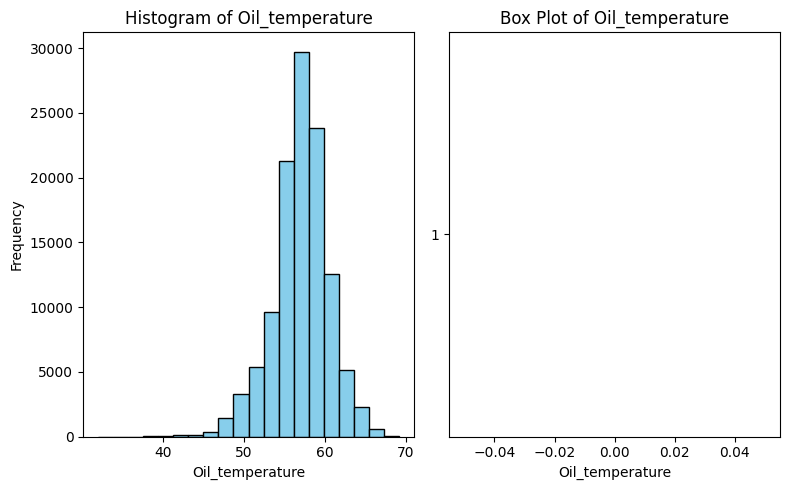

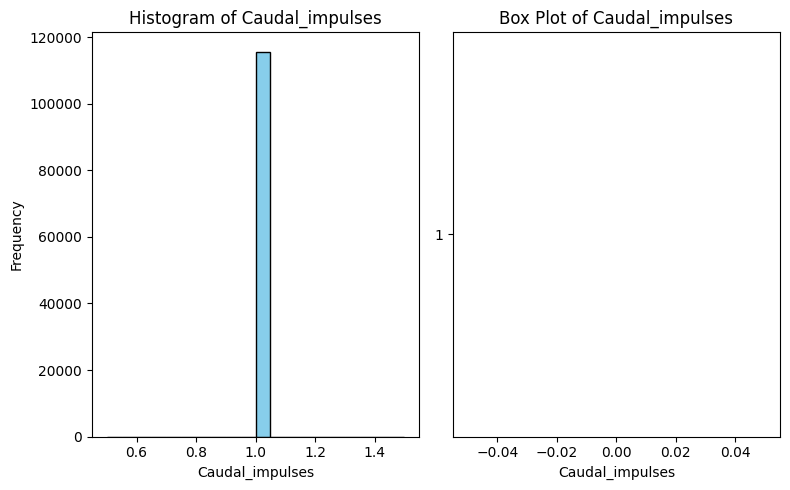

In [ ]:
data = pd.read_csv('/content/MetroPT3(AirCompressor).csv')
numerical_columns = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs',
                     'Motor_current', 'Oil_temperature', 'Caudal_impulses']
for column in numerical_columns:
    plt.figure(figsize=(8, 5))
    plt.subplot(1, 2, 1)
    plt.hist(data[column], bins=20, color='skyblue', edgecolor='black')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {column}')
    plt.subplot(1, 2, 2)
    plt.boxplot(data[column], vert=False)
    plt.xlabel(column)
    plt.title(f'Box Plot of {column}')
    plt.tight_layout()

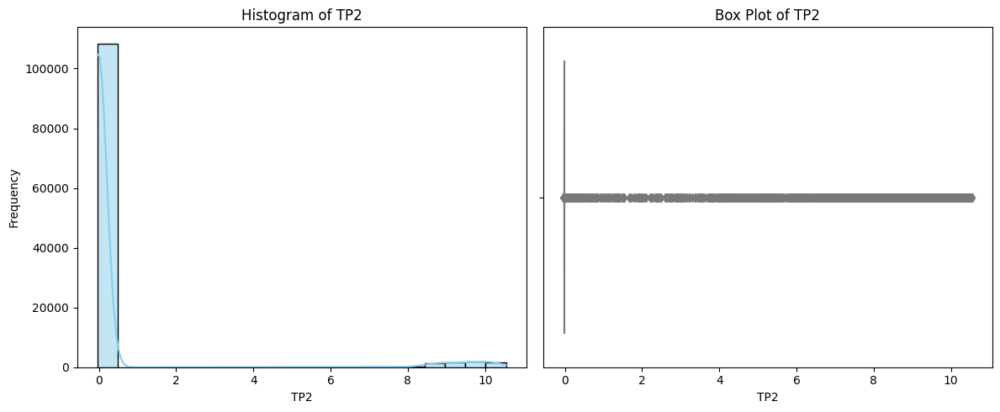

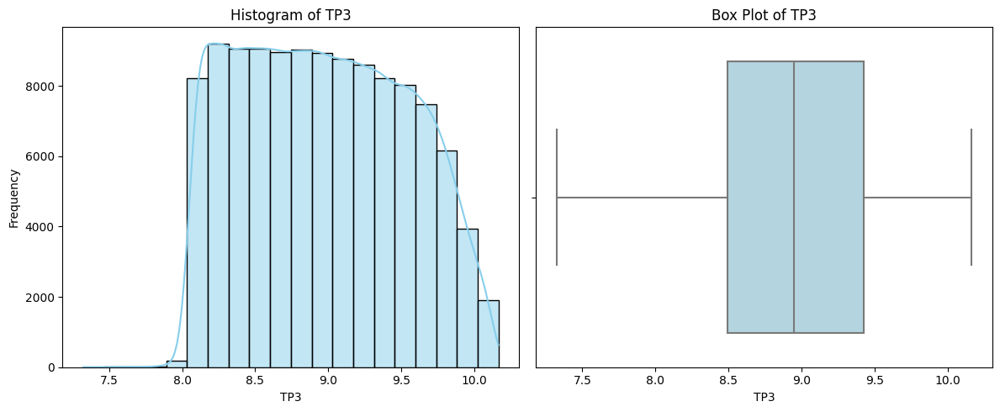

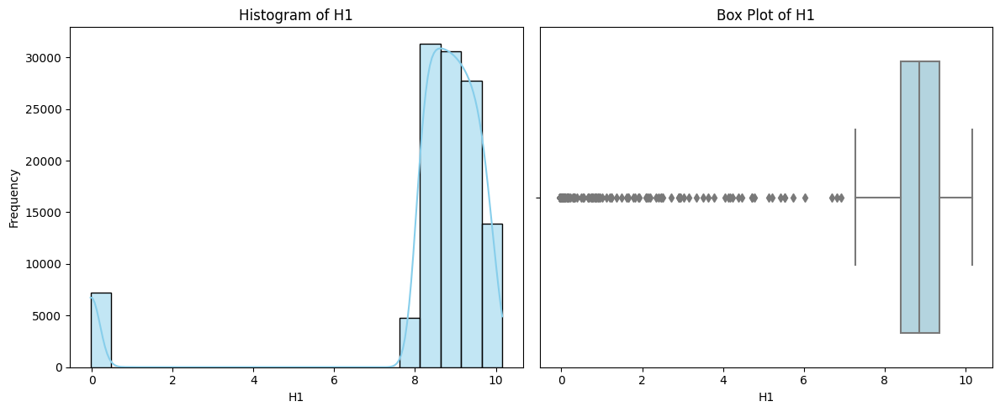

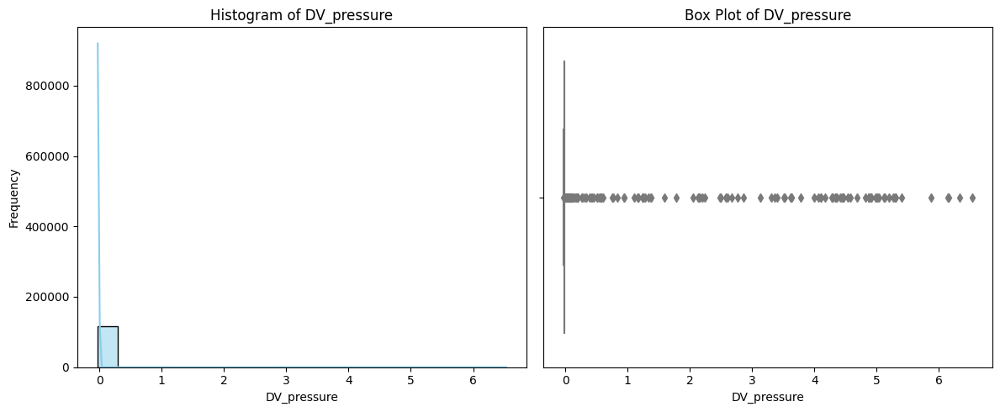

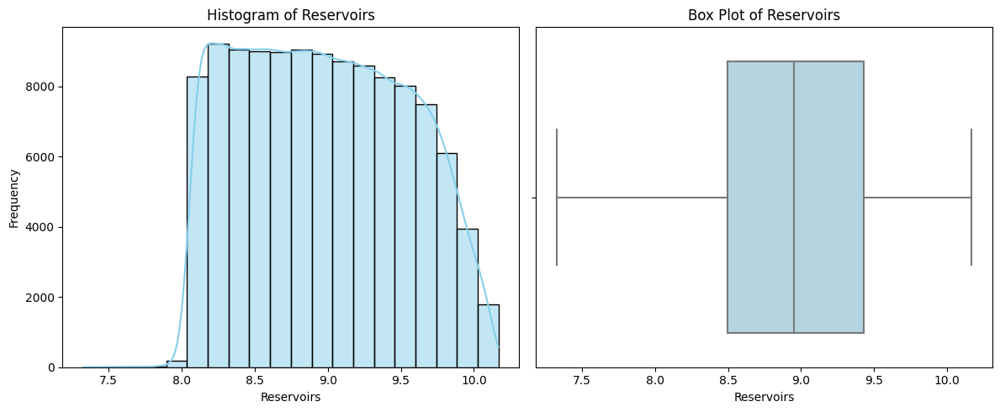

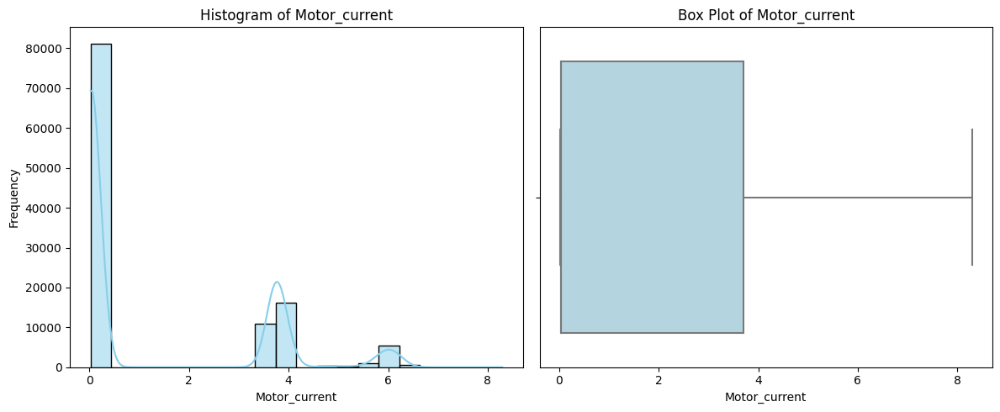

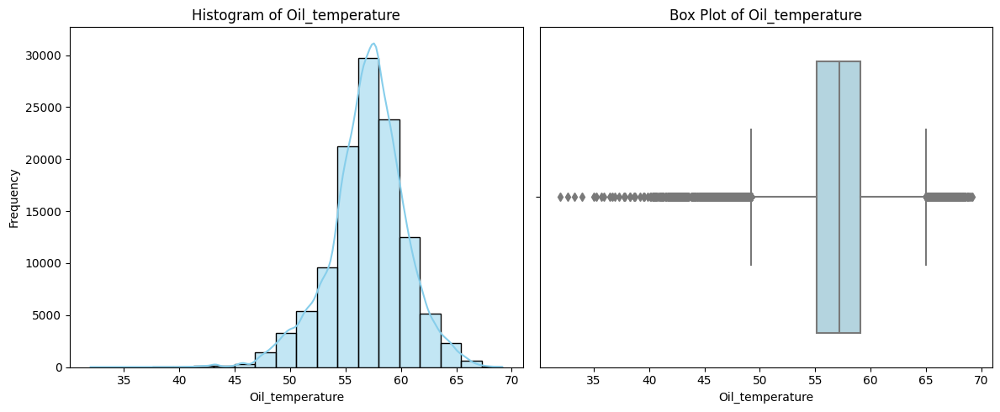

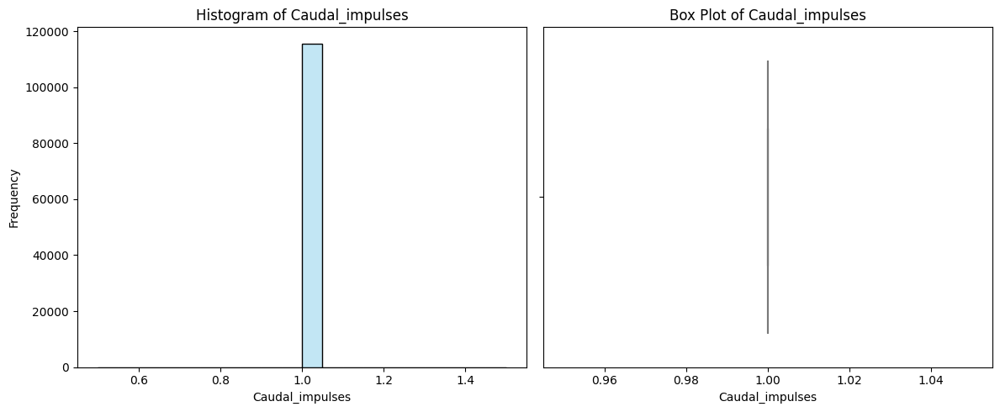

In [ ]:
import seaborn as sns
for column in numerical_columns:
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    sns.histplot(data[column], bins=20, color='skyblue', kde=True)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {column}')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[column], color='lightblue')
    plt.xlabel(column)
    plt.title(f'Box Plot of {column}')
    plt.tight_layout()

<ipython-input-16-583cdb53612d>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


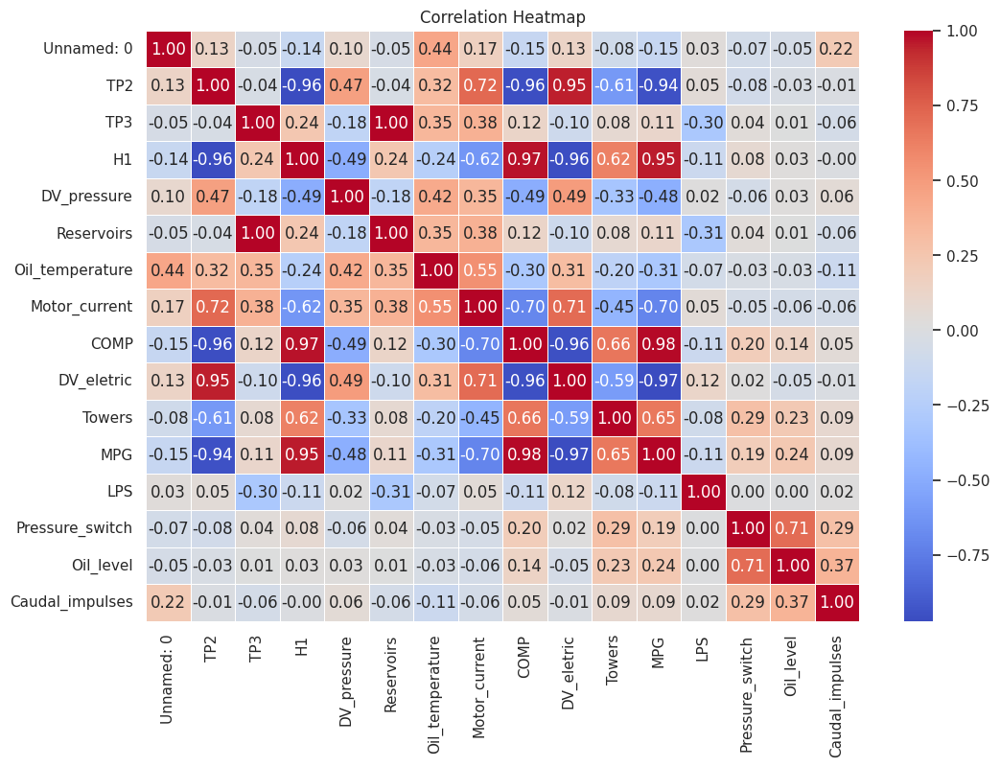

In [ ]:
correlation_matrix = df.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

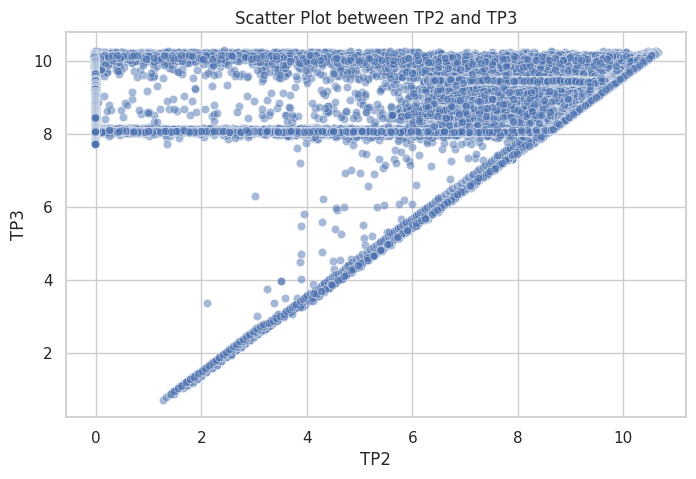

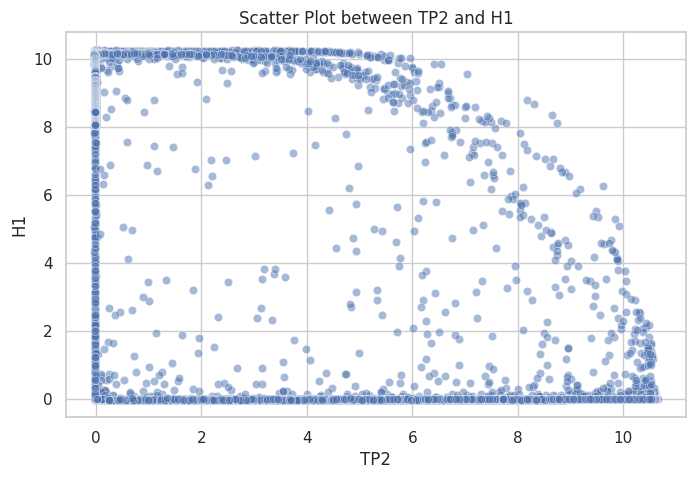

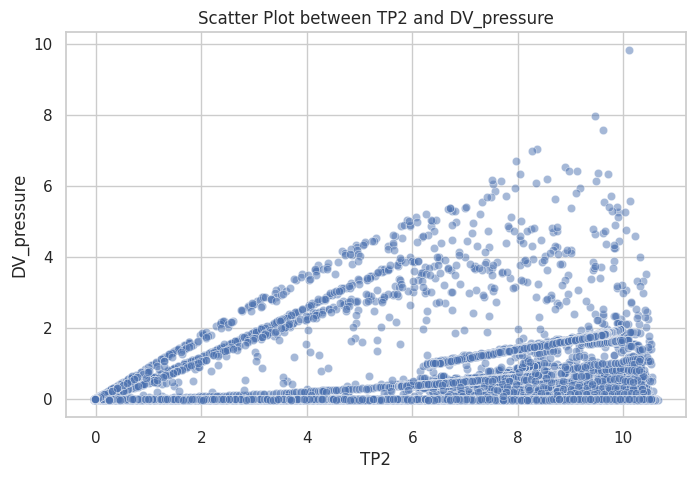

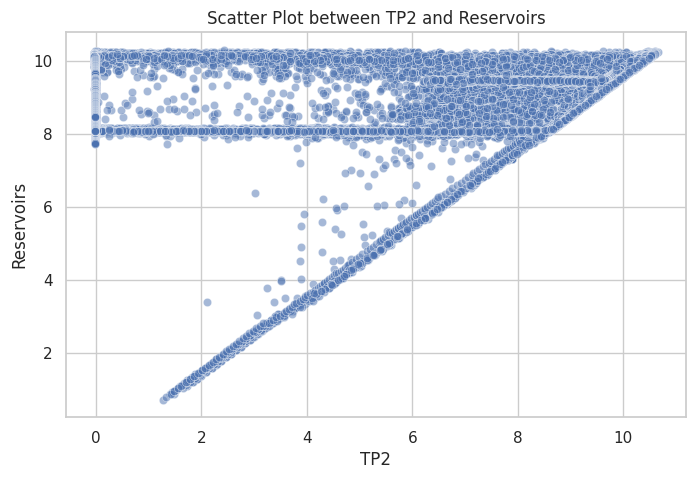

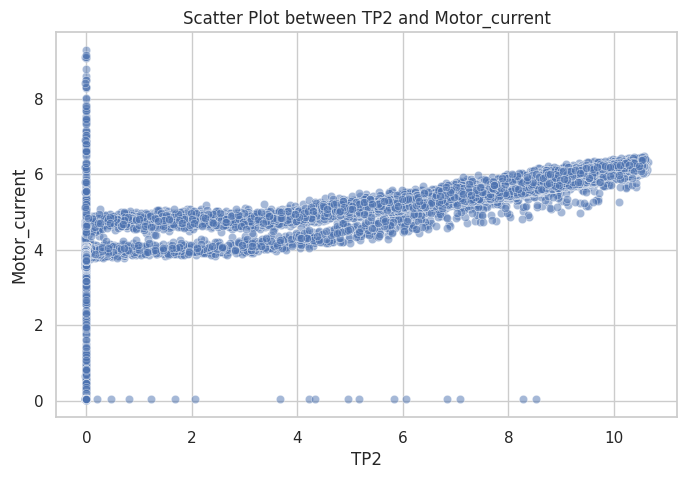

...

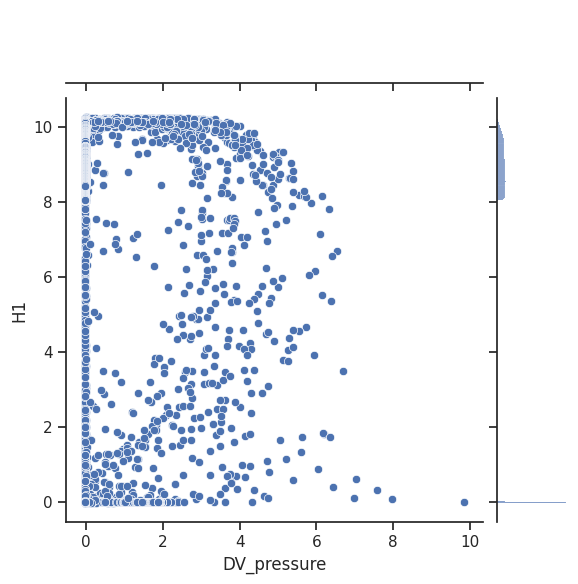

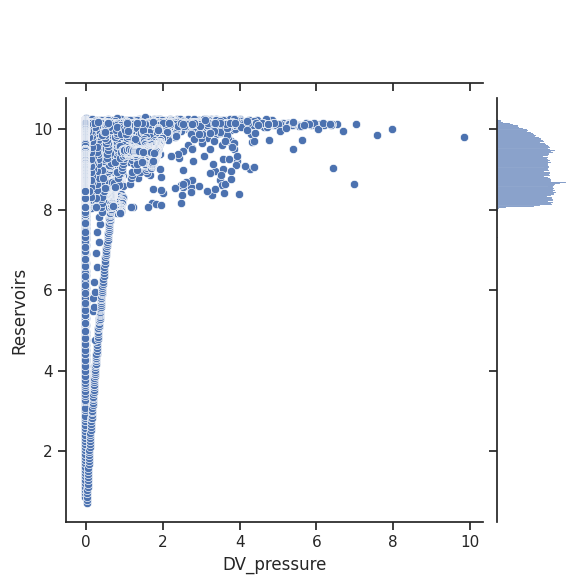

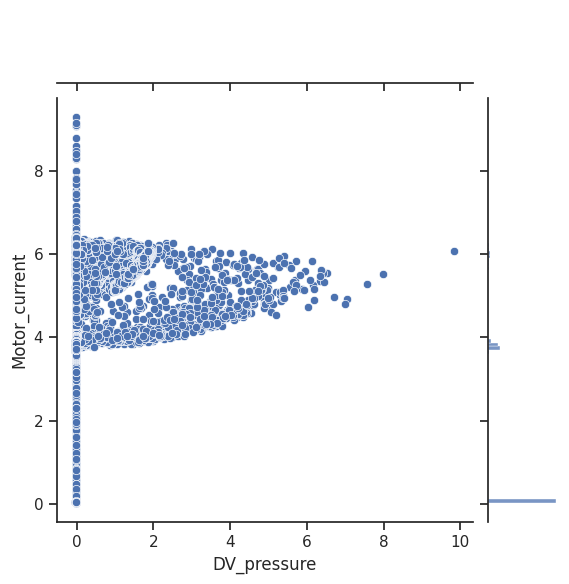

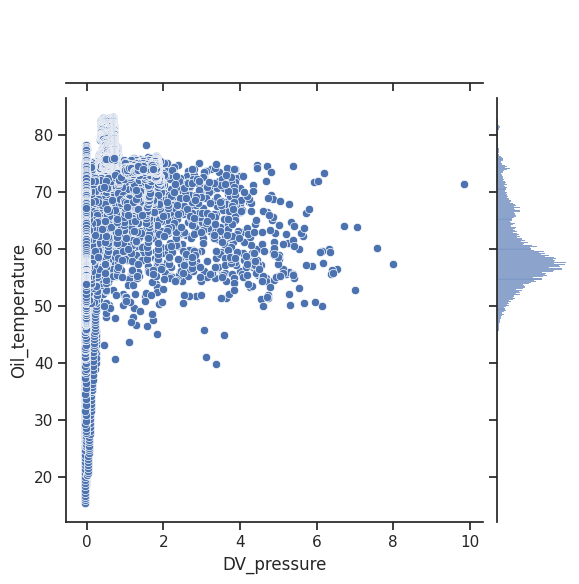

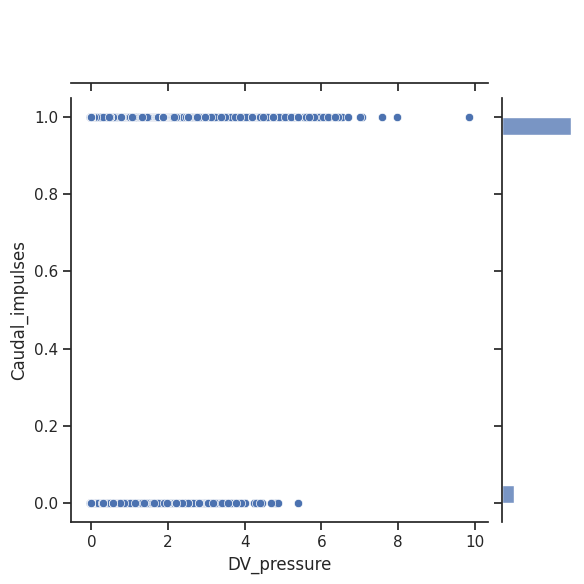

KeyboardInterrupt: ignored

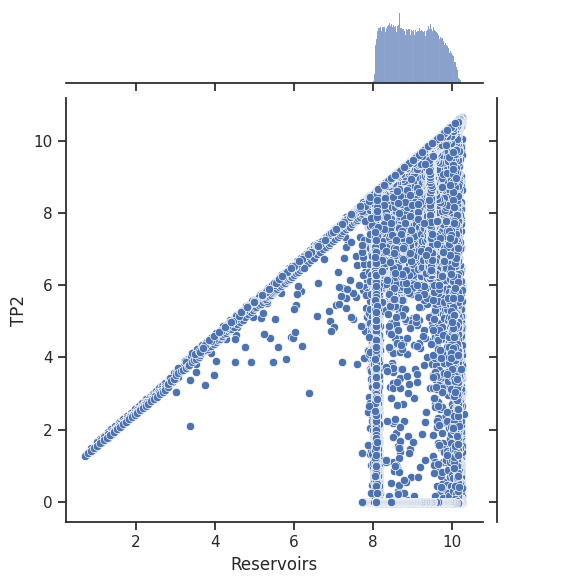

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
numerical_columns = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs',
                     'Motor_current', 'Oil_temperature', 'Caudal_impulses']
for x_column in numerical_columns:
    for y_column in numerical_columns:
        if x_column != y_column:
            plt.figure(figsize=(8, 5))
            sns.scatterplot(data=data, x=x_column, y=y_column, alpha=0.5)
            plt.title(f'Scatter Plot between {x_column} and {y_column}')
            plt.xlabel(x_column)
            plt.ylabel(y_column)
            plt.show()
sns.set(style="ticks")
sns.pairplot(data=data[numerical_columns], diag_kind='kde', plot_kws={'alpha': 0.5})
plt.show()
for x_column in numerical_columns:
    for y_column in numerical_columns:
        if x_column != y_column:
            sns.jointplot(data=data, x=x_column, y=y_column, kind='scatter')
            plt.show()
for x_column in numerical_columns:
    for y_column in numerical_columns:
        if x_column != y_column:
            sns.jointplot(data=data, x=x_column, y=y_column, kind='hex')
            plt.show()


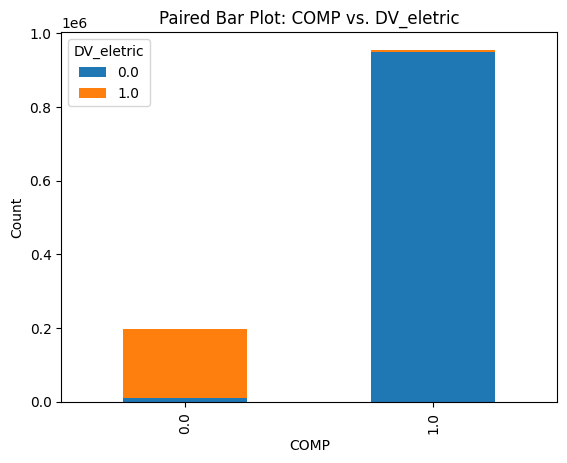

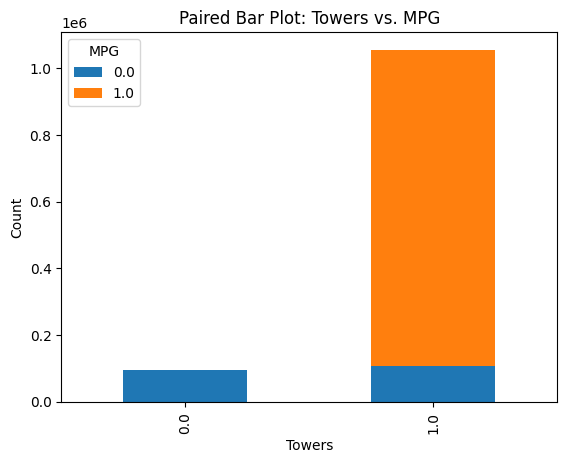

In [ ]:
attribute_pairs = [("COMP", "DV_eletric"), ("Towers", "MPG")]
for pair in attribute_pairs:
    attribute1, attribute2 = pair
    crosstab = pd.crosstab(df[attribute1], df[attribute2])
    crosstab.plot(kind="bar", stacked=True)
    plt.xlabel(attribute1)
    plt.ylabel("Count")
    plt.title(f"Paired Bar Plot: {attribute1} vs. {attribute2}")
    plt.show()

In [ ]:
import pandas as pd
condition_1 = (df['TP2'] >= -1) & (df['TP2'] <= 0)
condition_2 = (df['TP3'] >= 8) & (df['TP3'] <= 10)
condition_3 = (df['H1'] >= 8) & (df['H1'] <= 10)
condition_4 = (df['DV_pressure'] >= -1) & (df['DV_pressure'] <= 0)
df['maintenance_needed'] = 0
df.loc[condition_1 | condition_2 | condition_3 | condition_4, 'maintenance_needed'] = 1
count=0
count1=0
for i in df[['maintenance_needed']]:
  if i==1:
    count=count+1
  else:
    count1=count1+1
print(count,count1)


0 1


FIRST OBJECTIVE
Predictive Maintenance for Compressors

Accuracy: 0.99
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     70030
           1       0.85      0.79      0.82      1085

    accuracy                           0.99     71115
   macro avg       0.92      0.89      0.91     71115
weighted avg       0.99      0.99      0.99     71115



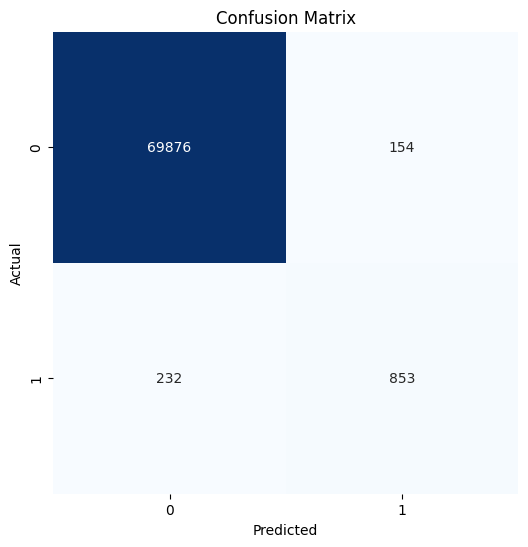

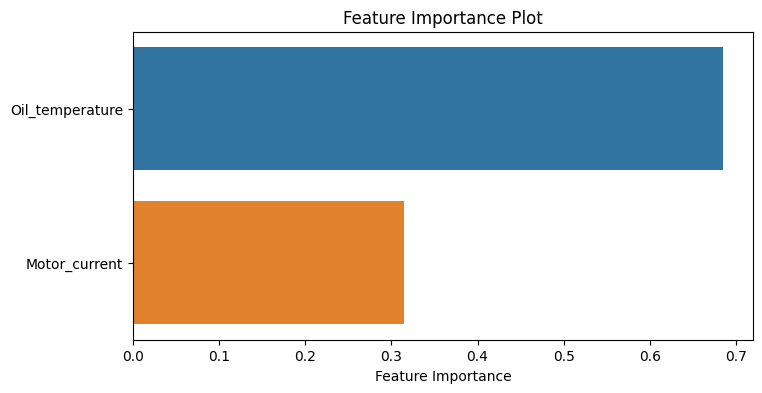

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

maintenance_threshold = 0.5
df['maintenance_needed'] = (df['DV_pressure'] > maintenance_threshold).astype(int)


features = ['Oil_temperature', 'Motor_current']
X = df[features]
y = df['maintenance_needed']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)


y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred))

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


feature_importance = model.feature_importances_
plt.figure(figsize=(8, 4))
sns.barplot(x=feature_importance, y=features, orient='h')
plt.xlabel('Feature Importance')
plt.title('Feature Importance Plot')
plt.show()


Second Objective
Anomaly Detection for Air Quality

Accuracy: 1.00
ROC AUC: 0.50
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2923
           1       0.00      0.00      0.00         2

    accuracy                           1.00      2925
   macro avg       0.50      0.50      0.50      2925
weighted avg       1.00      1.00      1.00      2925



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


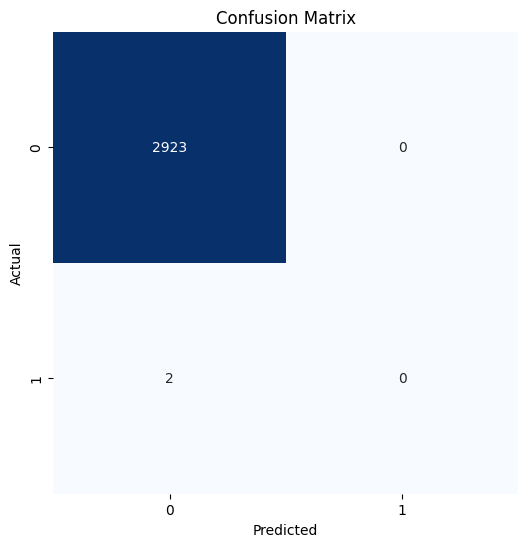

In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score

maintenance_threshold = 0.5

df['maintenance_needed'] = (df['DV_pressure'] > maintenance_threshold).astype(int)

features = ['Oil_temperature', 'Motor_current']
X = df[features]
y = df['maintenance_needed']

from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

model = RandomForestClassifier(n_estimators=100, random_state=42)

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(model, param_grid, cv=5)
grid_search.fit(X_train, y_train)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, best_model.predict_proba(X_test)[:, 1])
print(f'Accuracy: {accuracy:.2f}')
print(f'ROC AUC: {roc_auc:.2f}')

print(classification_report(y_test, y_pred))

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


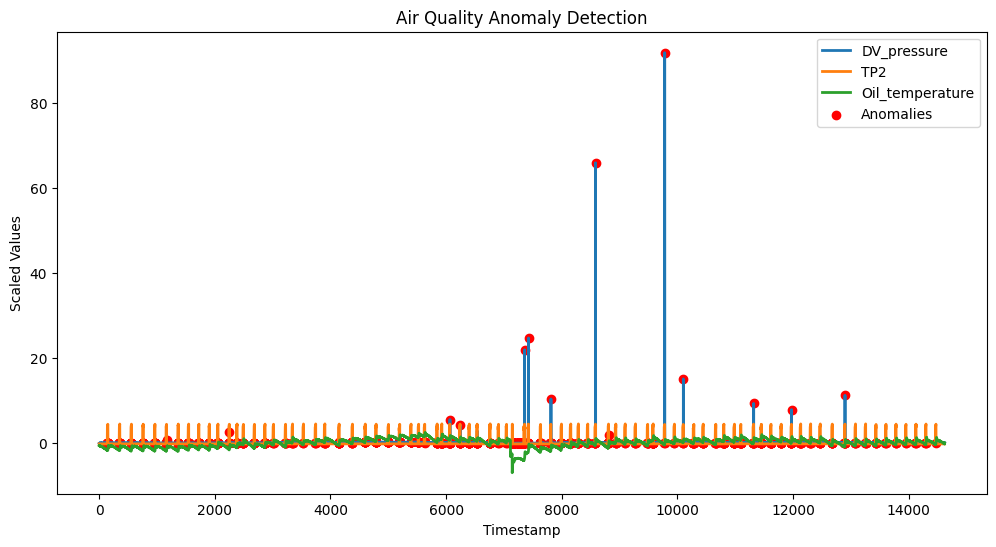

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer  # Import SimpleImputer

features = ['DV_pressure', 'TP2', 'Oil_temperature']
X = df[features]


imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)
model = IsolationForest(contamination=0.05, random_state=42)
model.fit(X_scaled)

y_pred = model.predict(X_scaled)

anomaly_df = pd.DataFrame({'Anomaly_Label': y_pred}, index=df.index)

plt.figure(figsize=(12, 6))
plt.plot(df.index, X_scaled[:, 0], label='DV_pressure', linewidth=2)
plt.plot(df.index, X_scaled[:, 1], label='TP2', linewidth=2)
plt.plot(df.index, X_scaled[:, 2], label='Oil_temperature', linewidth=2)
plt.scatter(anomaly_df.index[anomaly_df['Anomaly_Label'] == -1], X_scaled[anomaly_df['Anomaly_Label'] == -1, 0], color='red', marker='o', label='Anomalies')
plt.xlabel('Timestamp')
plt.ylabel('Scaled Values')
plt.legend()
plt.title('Air Quality Anomaly Detection')
plt.show()
anomaly_df.to_csv('anomaly_labels.csv')

THIRD OBJECTIVE:
Energy Efficiency Optimization

In [ ]:
import pandas as pd

# Assuming you have a DataFrame named 'df' with a 'timestamp' column and 'Motor_current' column
# Replace 'df' with your actual DataFrame containing the dataset

# Convert the 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Calculate rolling mean for 'Motor_current' column with a minimum of 3 periods
df['Motor_current_rolling_mean'] = df['Motor_current'].rolling(window=3, min_periods=1).mean()

# Extract the date part from 'timestamp' column and create a new column 'Date'
df['Date'] = df['timestamp'].dt.date

# Group by 'Date' and calculate the mean of 'Motor_current' for each date
result = df.groupby('Date')['Motor_current'].mean().reset_index()

# Display the result
print(result)


           Date  Motor_current
0    2020-02-01       1.292689
1    2020-02-02       1.382803
2    2020-02-03       1.135509
3    2020-02-04       1.240221
4    2020-02-05       1.425138
..          ...            ...
127  2020-06-09       2.104581
128  2020-06-10       2.076246
129  2020-06-11       2.081281
130  2020-06-12       0.942217
131  2020-06-13       2.459713

[132 rows x 2 columns]


In [ ]:
import pandas as pd

# Assuming you have a DataFrame named 'df' with a 'timestamp' column and 'Motor_current' column
# Replace 'df' with your actual DataFrame containing the dataset

# Convert the 'timestamp' column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Calculate rolling mean for 'Motor_current' column with a minimum of 3 periods
df['Motor_current_rolling_mean'] = df['Motor_current'].rolling(window=3, min_periods=1).mean()

# Extract the month from 'timestamp' column and create a new column 'Month'
df['Month'] = df['timestamp'].dt.to_period('M')

# Group by 'Month' and calculate the mean of 'Motor_current' for each month
result = df.groupby('Month')['Motor_current'].mean().reset_index()

# Display the result
print(result)


     Month  Motor_current
0  2020-02       1.245202
1  2020-03       2.081127
2  2020-04       1.857184
3  2020-05       2.016279
4  2020-06       2.613321


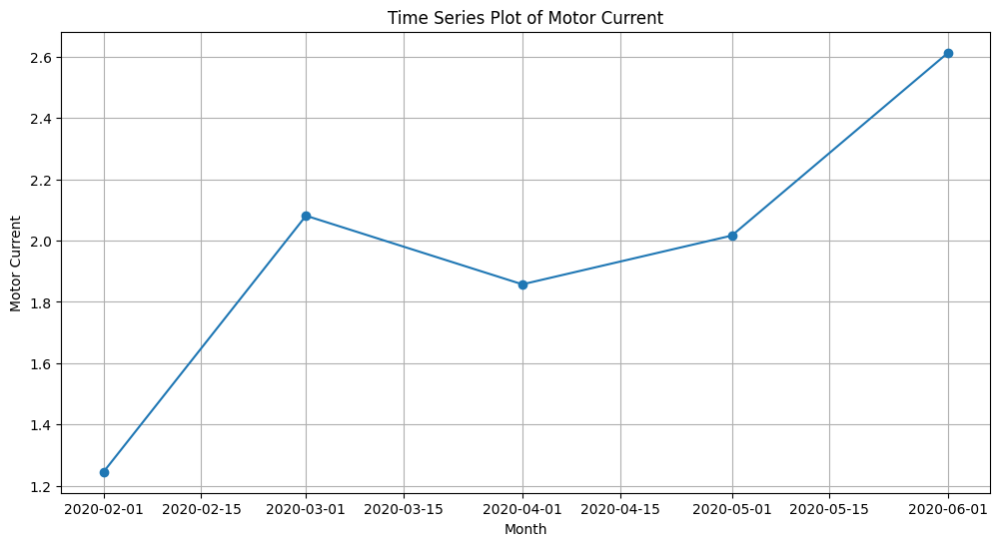

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have the 'result' DataFrame with columns 'Month' and 'Motor_current'
# Replace 'result' with your actual DataFrame

# Convert the 'Month' column to a datetime format
result['Month'] = pd.to_datetime(result['Month'].astype(str) + '-01')

# Set 'Month' column as the index for time series analysis
result.set_index('Month', inplace=True)

# Plot the time series data
plt.figure(figsize=(12, 6))
plt.plot(result.index, result['Motor_current'], marker='o', linestyle='-')
plt.title('Time Series Plot of Motor Current')
plt.xlabel('Month')
plt.ylabel('Motor Current')
plt.grid(True)
plt.show()


In [ ]:
df.groupby(df['timestamp'].dt.date)['Motor_current'].describe()

,count,mean,std,min,25%,50%,75%,max
timestamp,,,,,,,,
2020-02-01,7144.0,1.292689,1.987705,0.0300,0.0375,0.0400,3.757500,6.3750
2020-02-02,7031.0,1.382803,2.033639,0.0325,0.0375,0.0375,3.762500,7.3575
2020-02-03,8716.0,1.135509,1.918132,0.0325,0.0375,0.0375,3.720625,6.8675
2020-02-04,8717.0,1.240221,1.965530,0.0275,0.0375,0.0375,3.737500,6.3625
2020-02-05,7437.0,1.425138,2.040345,0.0275,0.0375,0.0375,3.742500,6.3975
2020-02-06,4939.0,1.245672,1.964878,0.0250,0.0375,0.0375,3.720000,6.3900
2020-02-07,7052.0,1.390153,2.023658,0.0200,0.0350,0.0375,3.725000,6.3875
2020-02-08,8689.0,1.498592,2.069897,0.0300,0.0350,0.0375,3.722500,8.2925
2020-02-09,7279.0,1.299397,1.984754,0.0300,0.0350,0.0375,3.710000,6.3275


<ipython-input-45-acd09bee9d2c>:11: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  monthly_means = df.groupby(df['timestamp'].dt.strftime('%Y-%m')).mean()


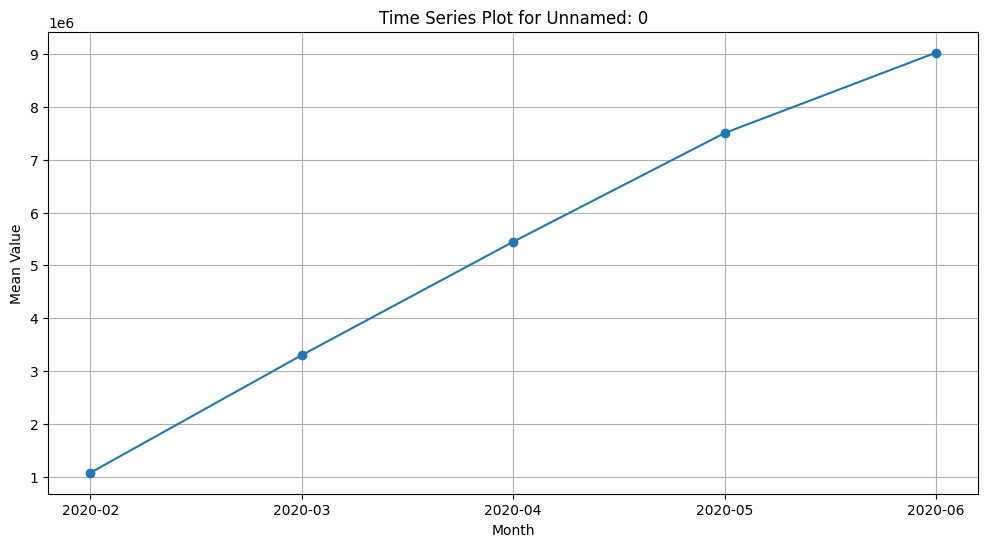

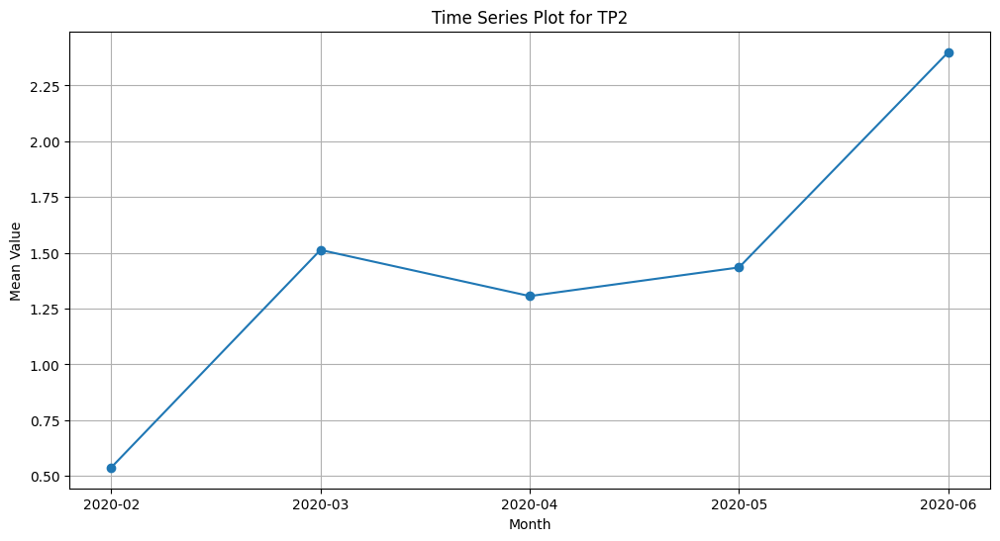

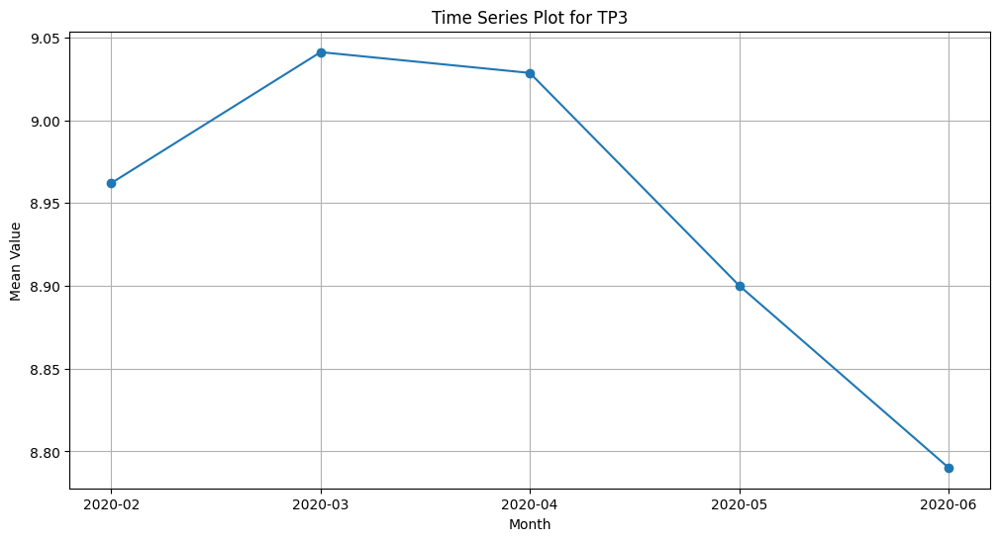

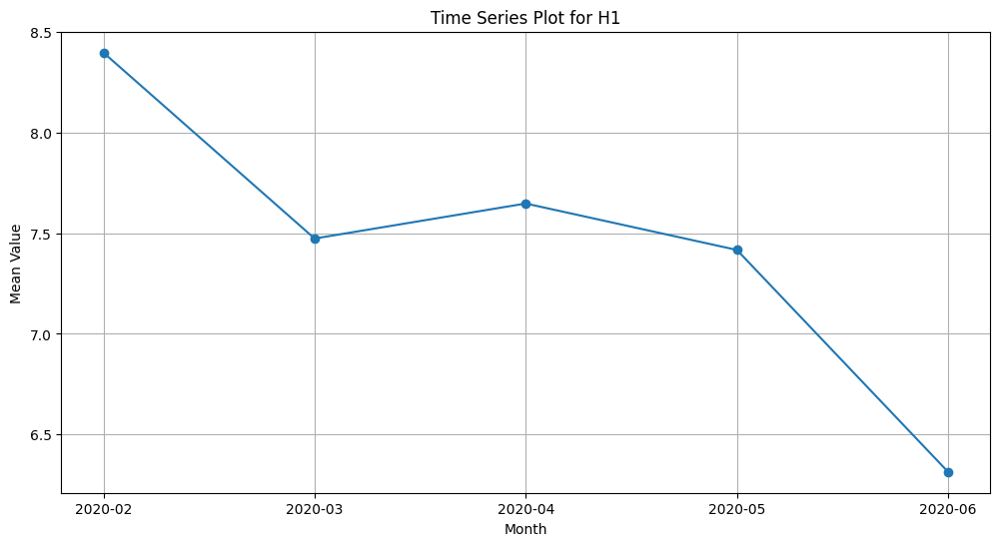

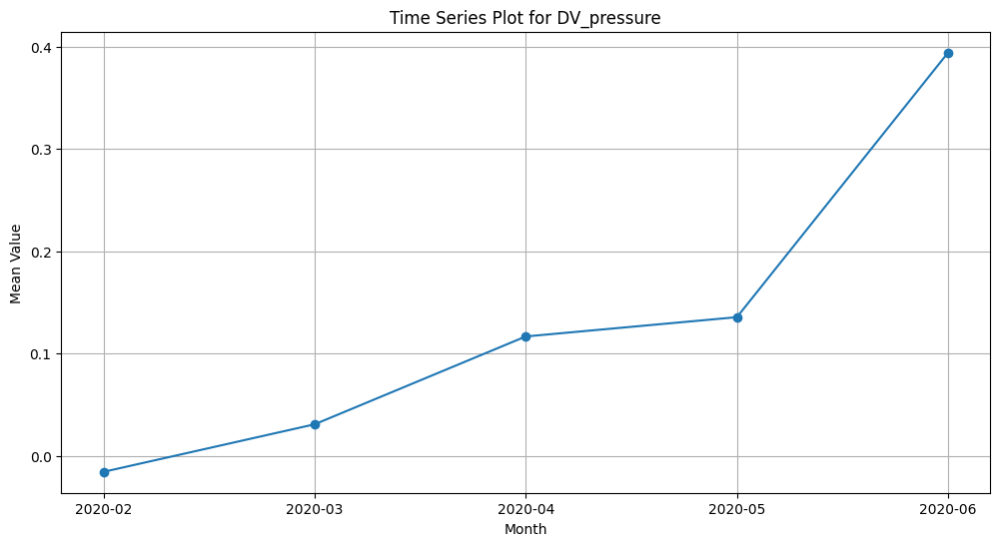

...

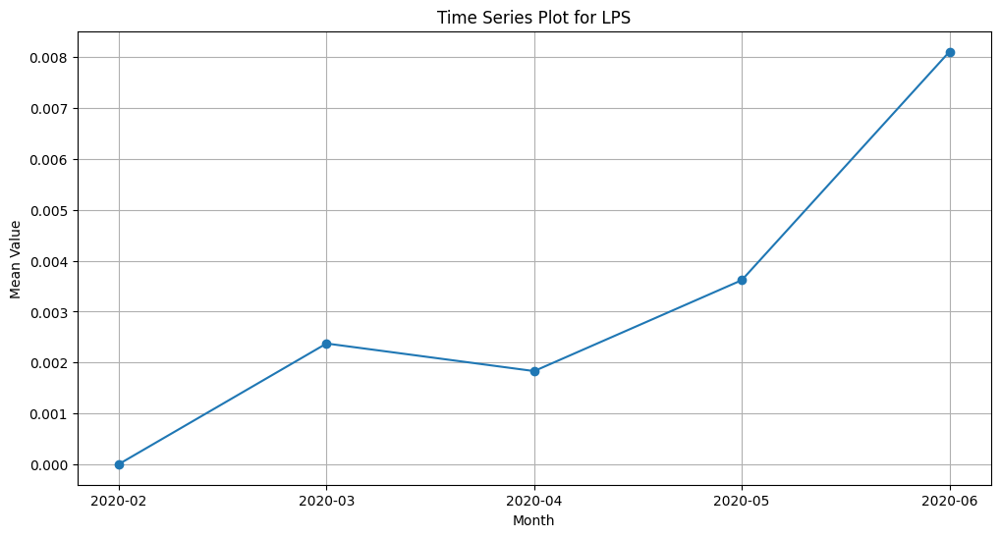

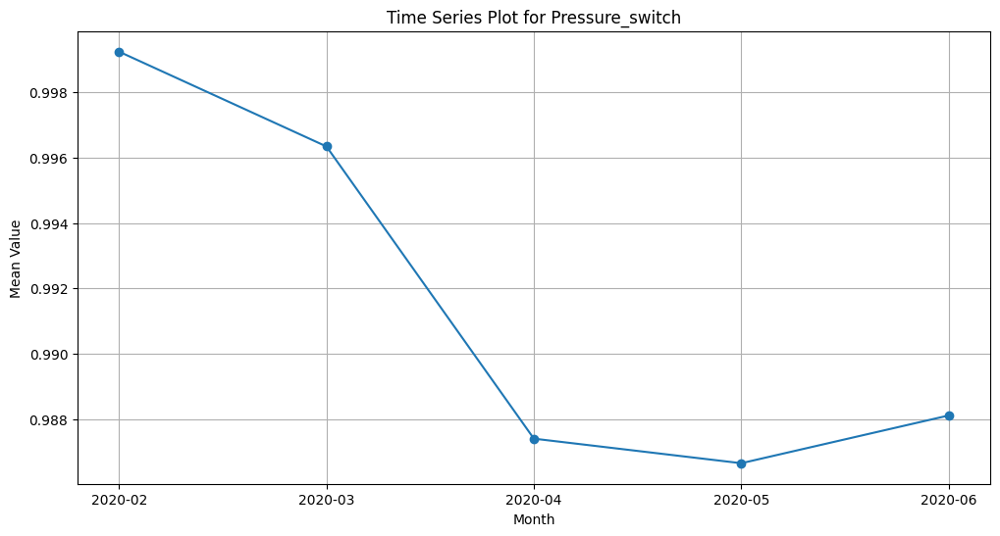

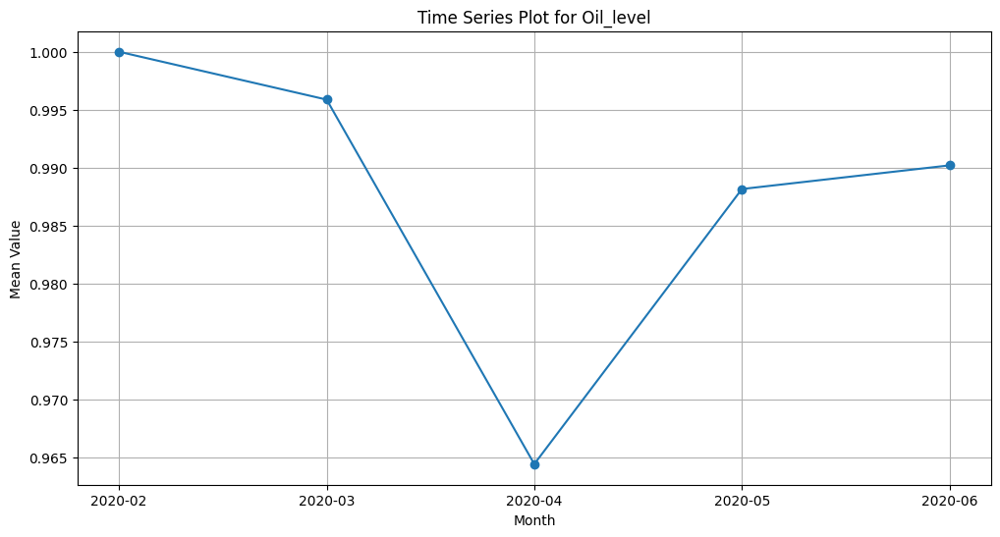

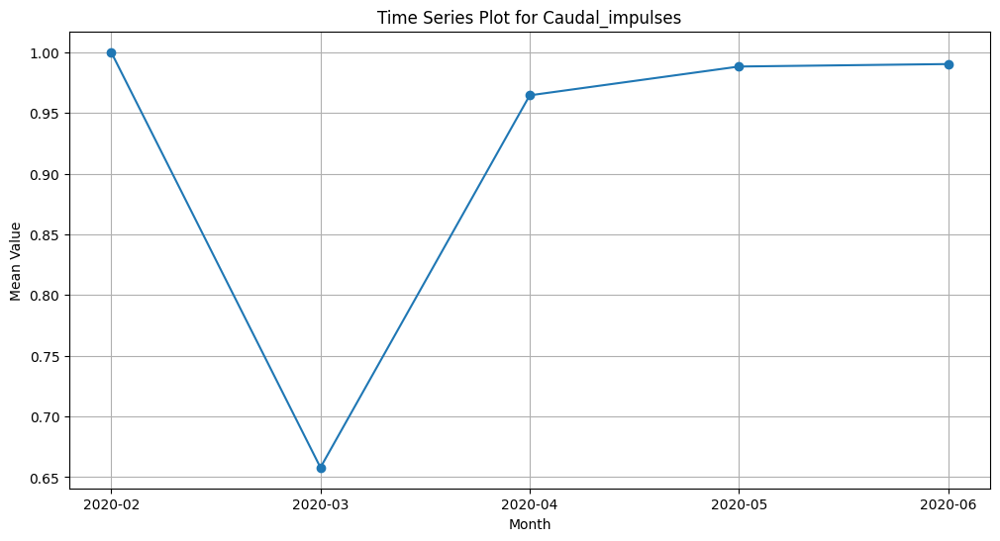

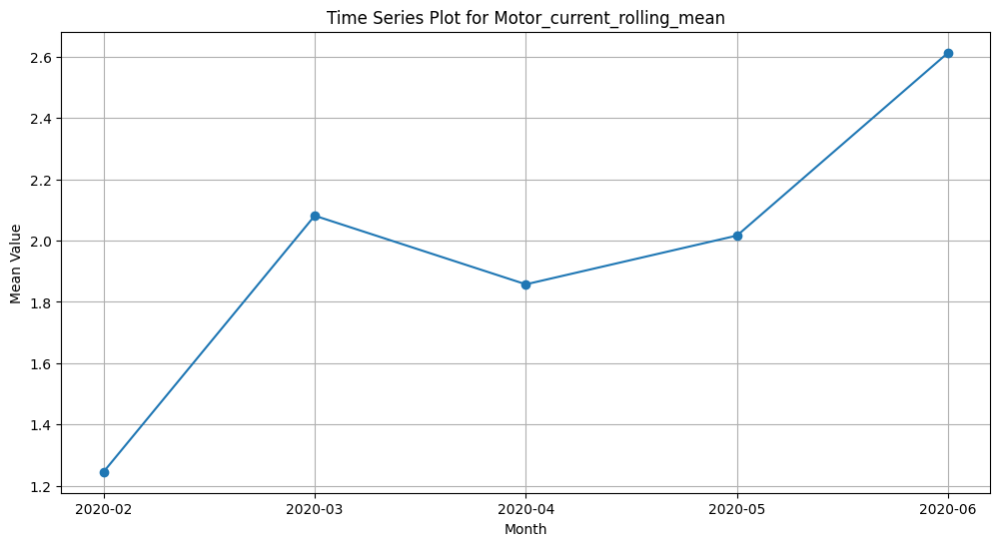

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df' with columns including a timestamp column
# Replace 'df' with your actual DataFrame containing the dataset

# Convert the timestamp column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Group the DataFrame by month and calculate the mean for each column
monthly_means = df.groupby(df['timestamp'].dt.strftime('%Y-%m')).mean()

# Iterate through each column and create separate time series plots
for column in monthly_means.columns:
    plt.figure(figsize=(12, 6))
    plt.plot(monthly_means.index, monthly_means[column], marker='o', linestyle='-')
    plt.title(f'Time Series Plot for {column}')
    plt.xlabel('Month')
    plt.ylabel('Mean Value')
    plt.grid(True)
    plt.show()


<ipython-input-57-8c909771ece9>:11: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  two_hourly_means = df.groupby(df['timestamp'].dt.floor('2H')).mean()


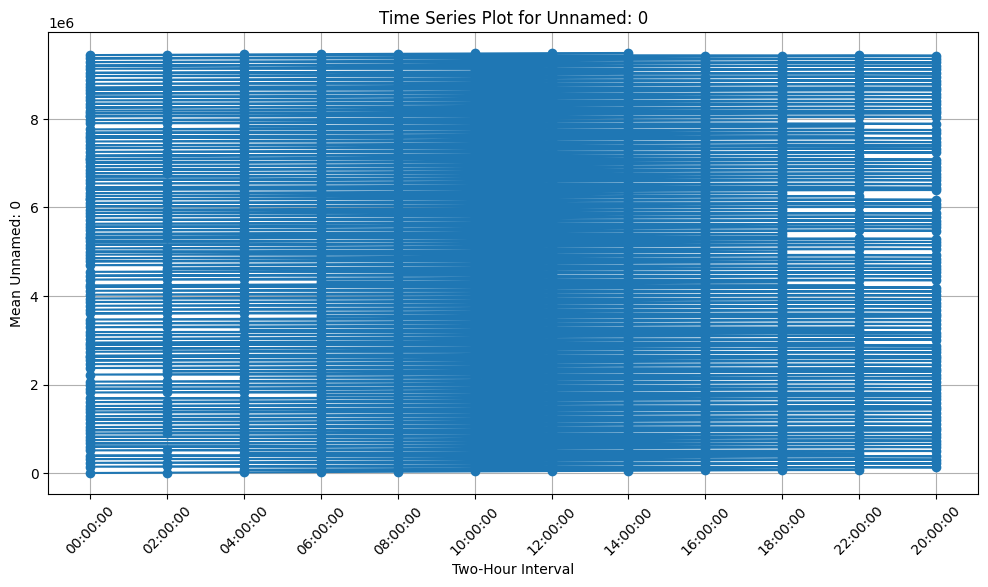

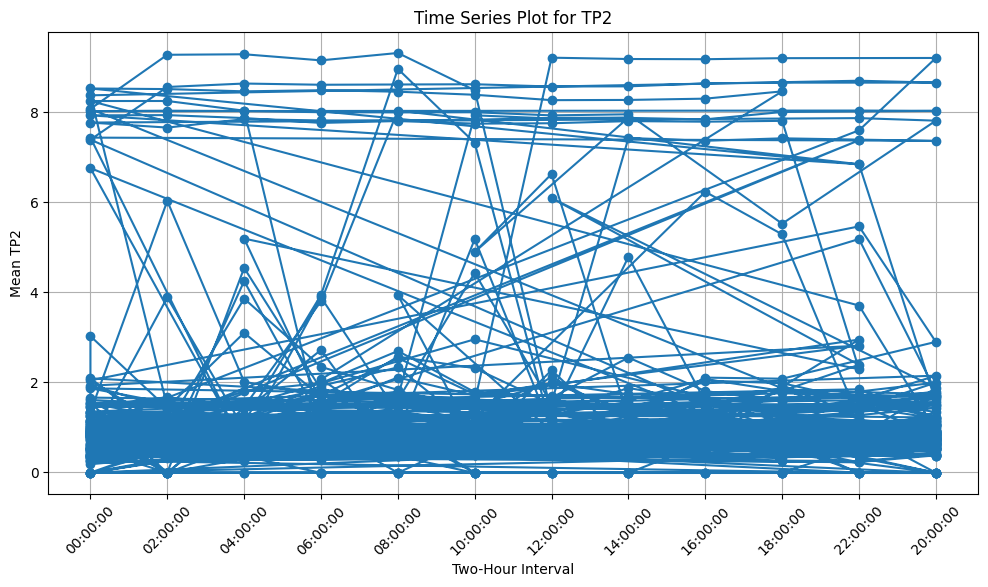

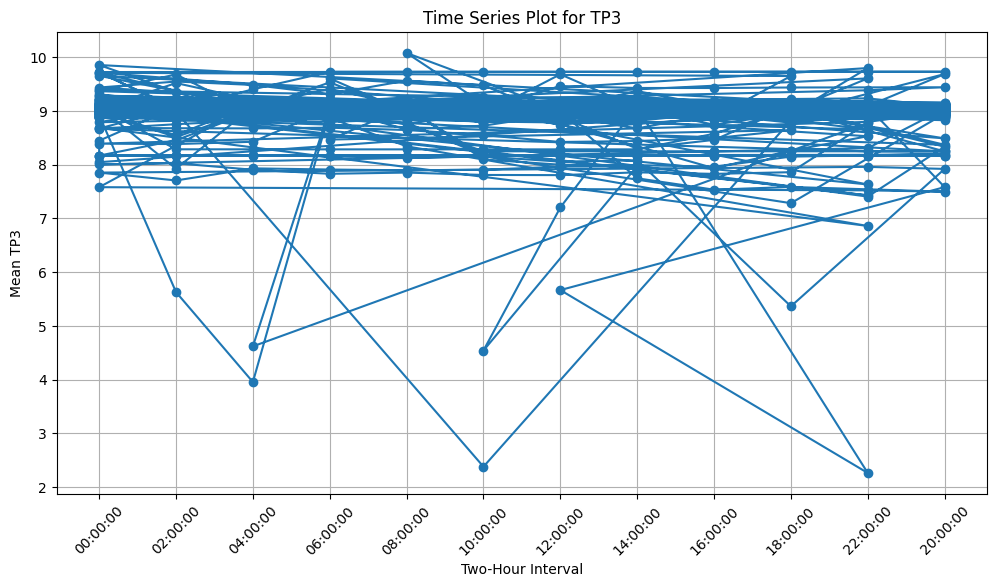

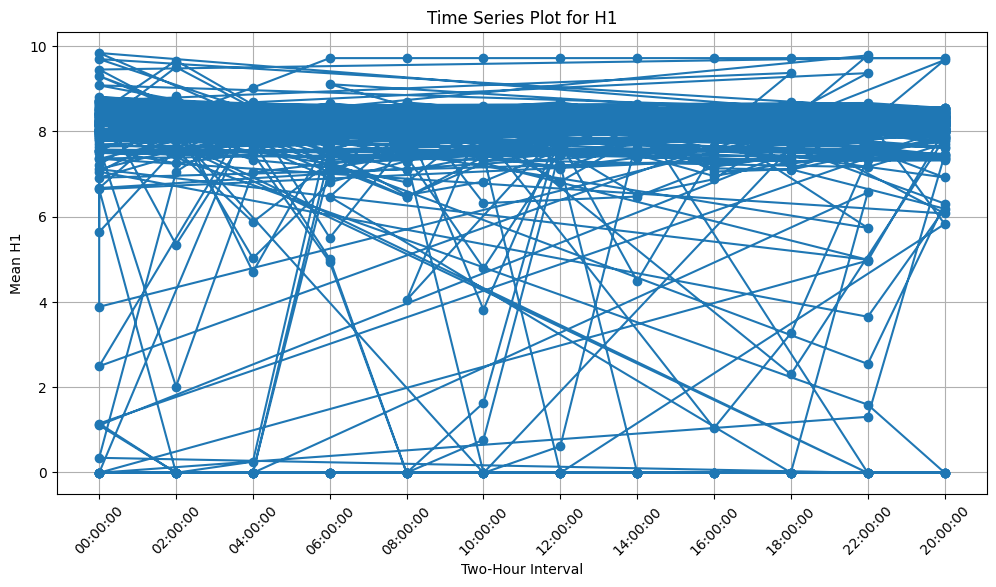

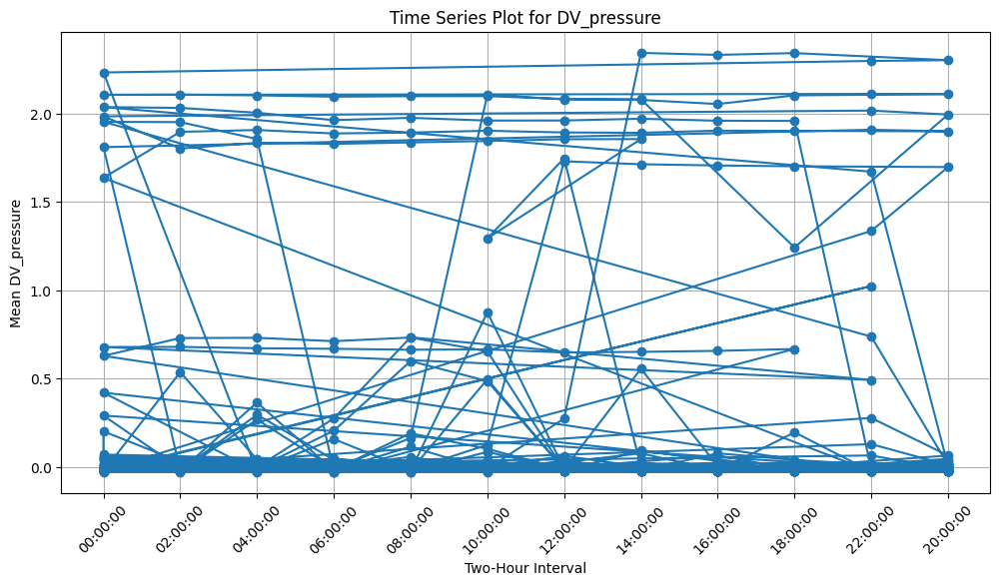

...

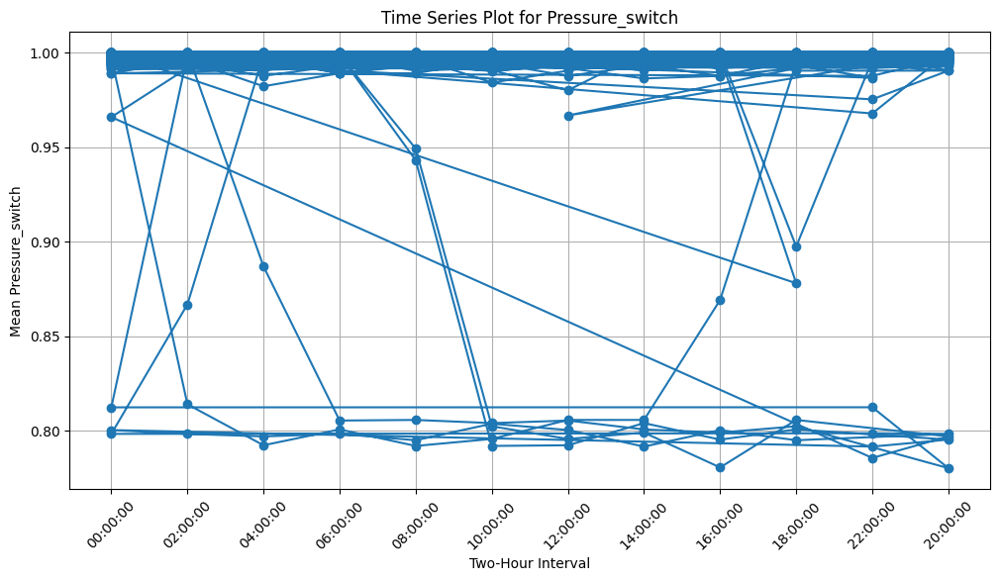

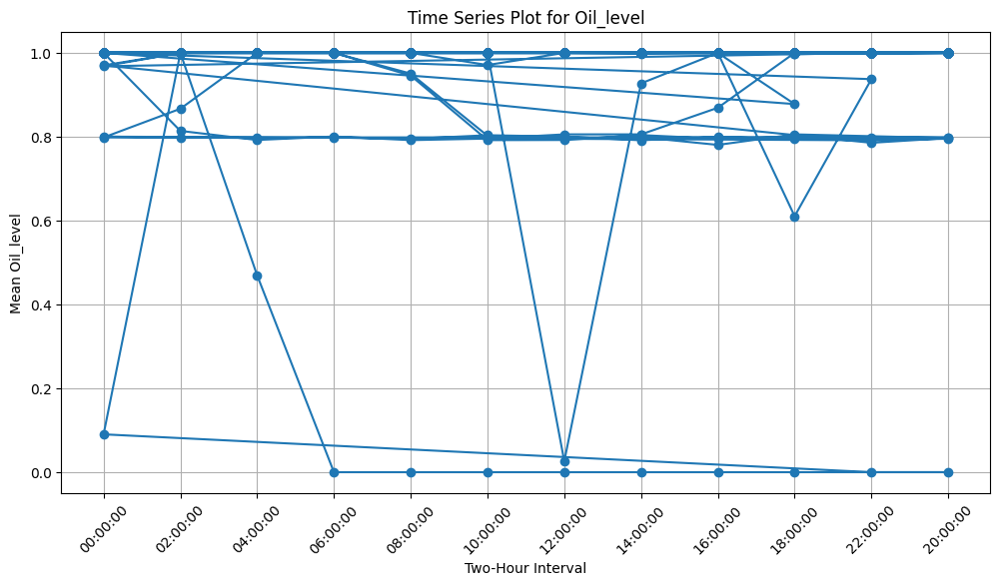

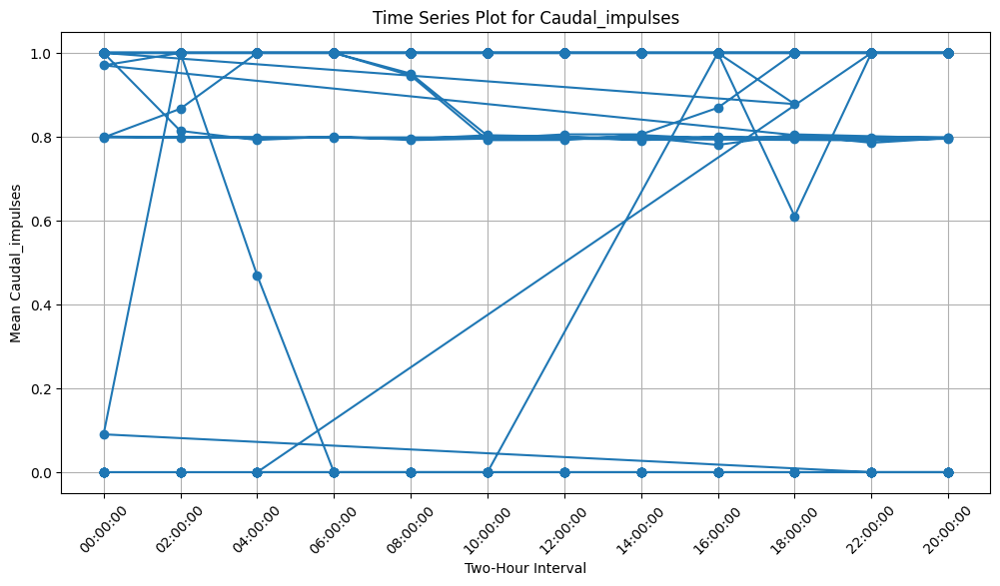

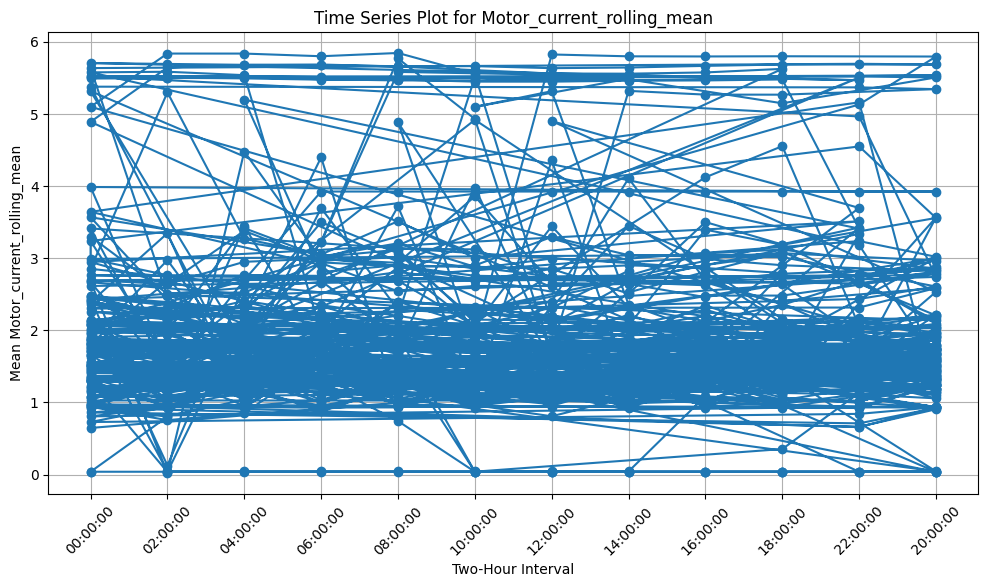

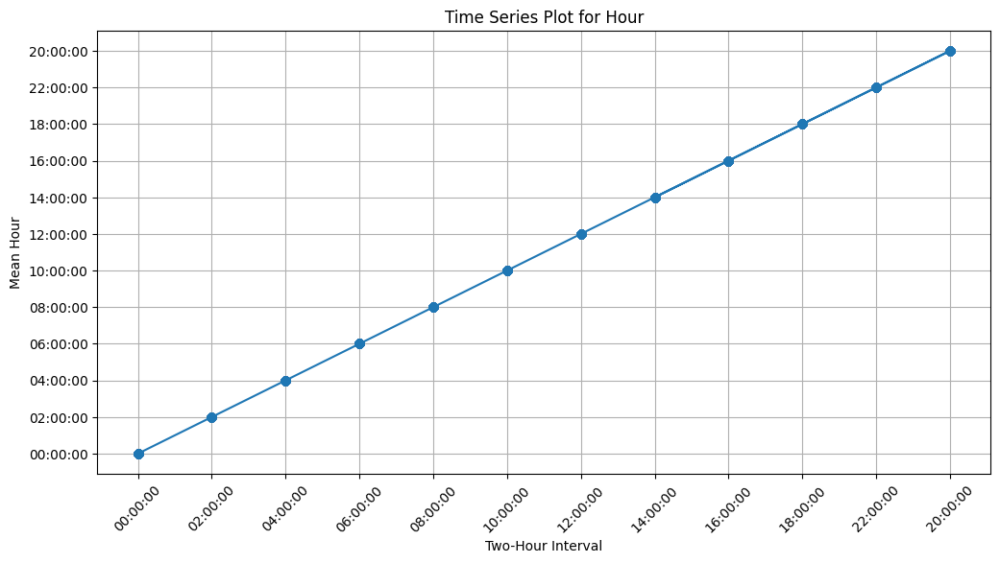

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df' with columns including a timestamp column
# Replace 'df' with your actual DataFrame containing the dataset

# Convert the timestamp column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'], format='%d-%m-%Y %H:%M:%S')

# Group the DataFrame by two-hour intervals and calculate the mean for each column
two_hourly_means = df.groupby(df['timestamp'].dt.floor('2H')).mean()

# Create a new column 'Hour' to represent the two-hour intervals as hours
two_hourly_means['Hour'] = two_hourly_means.index.strftime('%H:%M:%S')

# Iterate through each column and create separate time series plots
for column in two_hourly_means.columns:
    plt.figure(figsize=(12, 6))
    plt.plot(two_hourly_means['Hour'], two_hourly_means[column], marker='o', linestyle='-')
    plt.title(f'Time Series Plot for {column}')
    plt.xlabel('Two-Hour Interval')
    plt.ylabel(f'Mean {column}')
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.show()


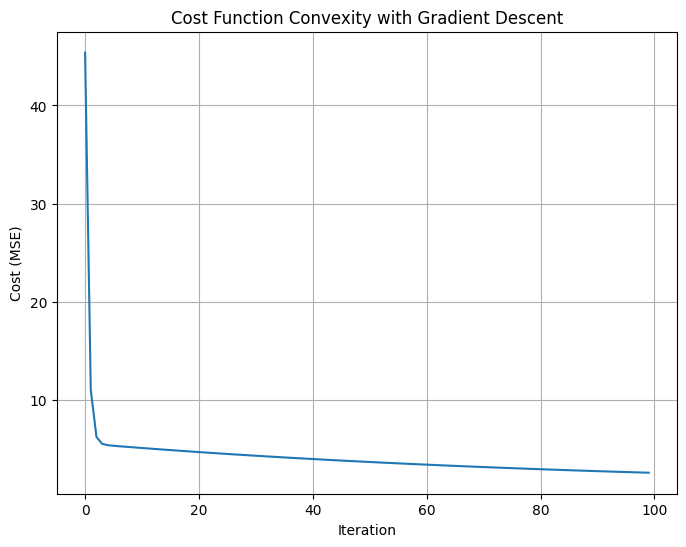

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Generate some sample data
np.random.seed(0)
X = np.random.rand(100, 1) * 10
y = 2 * X + 3 + np.random.randn(100, 1)

# Define a cost function (MSE) for a linear model (with parameters w and b)
def mse_cost(X, y, w, b):
    y_pred = X * w + b
    mse = mean_squared_error(y, y_pred)
    return mse

# Gradient descent hyperparameters
learning_rate = 0.01
num_iterations = 100

# Initialize parameters
w = np.random.randn()
b = np.random.randn()

# Lists to store the values for plotting
cost_history = []

# Gradient descent
for _ in range(num_iterations):
    # Calculate gradients
    dw = -(2 / len(X)) * np.sum(X * (y - (X * w + b)))
    db = -(2 / len(X)) * np.sum(y - (X * w + b))

    # Update parameters
    w -= learning_rate * dw
    b -= learning_rate * db

    # Calculate and store the cost
    cost = mse_cost(X, y, w, b)
    cost_history.append(cost)

# Plot the cost function
plt.figure(figsize=(8, 6))
plt.plot(cost_history)
plt.xlabel('Iteration')
plt.ylabel('Cost (MSE)')
plt.title('Cost Function Convexity with Gradient Descent')
plt.grid(True)
plt.show()


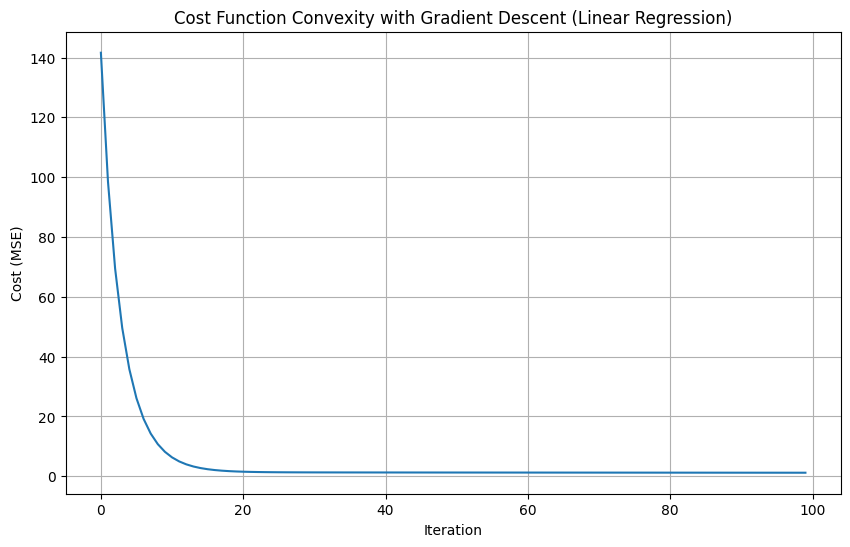

In [ ]:
df.fillna(0)

,Unnamed: 0,timestamp,TP2,TP3,H1,DV_pressure,Reservoirs,Oil_temperature,Motor_current,COMP,DV_eletric,Towers,MPG,LPS,Pressure_switch,Oil_level,Caudal_impulses
0,0,2020-02-01 00:00:00,-0.012,9.358,9.340,-0.024,9.358,53.600,0.0400,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
1,10,2020-02-01 00:00:10,-0.014,9.348,9.332,-0.022,9.348,53.675,0.0400,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
2,20,2020-02-01 00:00:19,-0.012,9.338,9.322,-0.022,9.338,53.600,0.0425,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
3,30,2020-02-01 00:00:29,-0.012,9.328,9.312,-0.022,9.328,53.425,0.0400,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
4,40,2020-02-01 00:00:39,-0.012,9.318,9.302,-0.022,9.318,53.475,0.0400,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21793,217930,2020-02-03 20:58:35,-0.010,8.338,8.320,-0.018,8.338,53.575,0.0375,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
21794,217940,2020-02-03 20:58:45,-0.012,8.330,8.316,-0.020,8.330,53.475,0.0375,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
21795,217950,2020-02-03 20:58:55,-0.010,8.326,8.310,-0.018,8.324,53.575,0.0375,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
21796,217960,2020-02-03 20:59:05,-0.012,8.318,8.304,-0.018,8.318,53.375,0.0400,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0


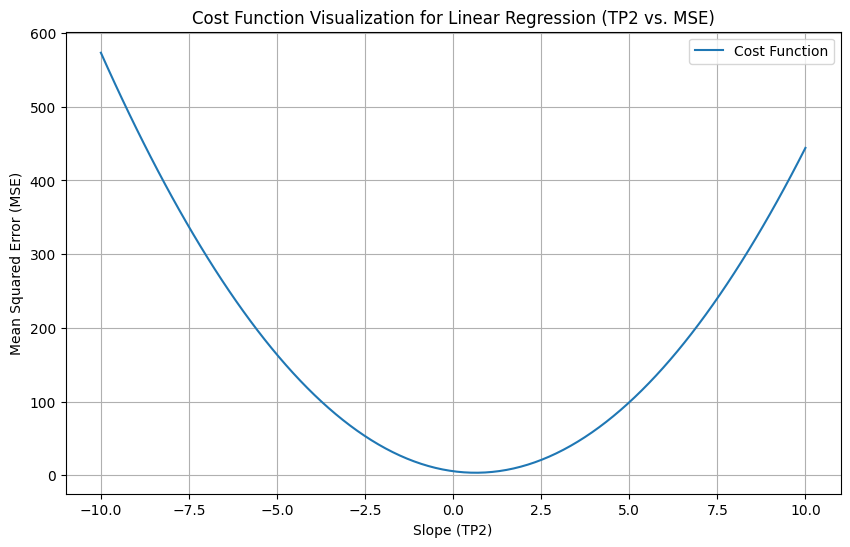

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer

# Assuming you have already loaded your dataset into X and y
target_variable = 'Motor_current'
features = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs','Oil_temperature']
X = df[features]
y = df[target_variable]
# Assuming you have already loaded your dataset into X and y

# Check for missing values in the target variable (y)
if np.isnan(y.to_numpy()).any():
    imputer = SimpleImputer(strategy='mean')
    y = imputer.fit_transform(y.to_numpy().reshape(-1, 1)).flatten()

# Define the feature name for which you want to visualize the cost function
feature_name = 'TP2'

# Extract the feature values and target variable
feature_values = X[feature_name].values.reshape(-1, 1)  # Reshape to a 2D array
target_variable = y

# Initialize arrays to store the cost and parameter values
cost_values = []
slope_values = []

# Create a range of slope values
slopes = np.linspace(-10, 10, 100)

# Fit the model for each slope value
for slope in slopes:
    model = LinearRegression(fit_intercept=True)  # We set fit_intercept=True to include the intercept
    model.coef_ = np.array([slope])  # Set the slope manually
    model.intercept_ = 0.0  # Set the intercept manually
    y_pred = model.predict(feature_values)  # Predict using the current slope
    cost = mean_squared_error(target_variable, y_pred)  # Calculate the cost
    cost_values.append(cost)
    slope_values.append(slope)

# Create a line chart to visualize the cost function
plt.figure(figsize=(10, 6))
plt.plot(slope_values, cost_values, label='Cost Function')
plt.xlabel(f'Slope ({feature_name})')
plt.ylabel('Mean Squared Error (MSE)')
plt.title(f'Cost Function Visualization for Linear Regression ({feature_name} vs. MSE)')
plt.legend()
plt.grid(True)
plt.show()


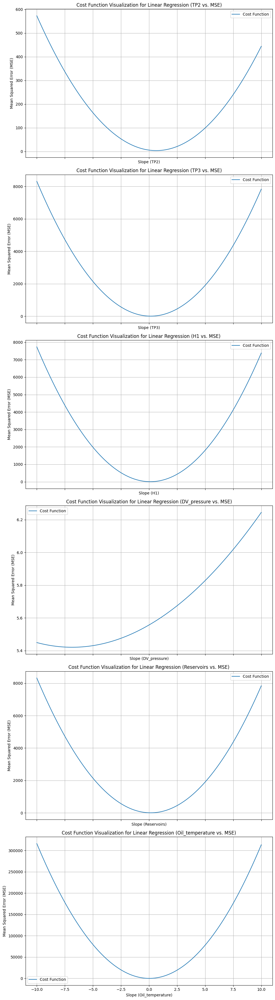

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer

# Assuming you have already loaded your dataset into X and y

# Check for missing values in the target variable (y)
if np.isnan(y).any():
    imputer = SimpleImputer(strategy='mean')
    y = imputer.fit_transform(y.values.reshape(-1, 1)).flatten()

# Get the list of column names in your dataset
column_names = X.columns

# Create a dictionary to store the cost values for each feature
cost_values_dict = {}

# Loop through each feature and calculate the cost function
for feature_name in column_names:
    # Extract the feature values
    feature_values = X[feature_name].values.reshape(-1, 1)  # Reshape to a 2D array

    # Handle missing values in the feature column
    if np.isnan(feature_values).any():
        imputer = SimpleImputer(strategy='mean')
        feature_values = imputer.fit_transform(feature_values).flatten()

    # Initialize arrays to store the cost and parameter values
    cost_values = []
    slope_values = []

    # Create a range of slope values
    slopes = np.linspace(-10, 10, 100)

    # Fit the model for each slope value
    for slope in slopes:
        model = LinearRegression(fit_intercept=True)  # We set fit_intercept=True to include the intercept
        model.coef_ = np.array([slope])  # Set the slope manually
        model.intercept_ = 0.0  # Set the intercept manually
        y_pred = model.predict(feature_values.reshape(-1, 1))  # Predict using the current slope
        cost = mean_squared_error(y, y_pred)  # Calculate the cost
        cost_values.append(cost)
        slope_values.append(slope)

    # Store the cost values in the dictionary
    cost_values_dict[feature_name] = (slope_values, cost_values)

# Create subplots for each feature's cost function
fig, axes = plt.subplots(len(column_names), 1, figsize=(10, 6 * len(column_names)), sharex=True)

for i, feature_name in enumerate(column_names):
    slope_values, cost_values = cost_values_dict[feature_name]
    axes[i].plot(slope_values, cost_values, label='Cost Function')
    axes[i].set_xlabel(f'Slope ({feature_name})')
    axes[i].set_ylabel('Mean Squared Error (MSE)')
    axes[i].set_title(f'Cost Function Visualization for Linear Regression ({feature_name} vs. MSE)')
    axes[i].legend()
    axes[i].grid(True)

plt.tight_layout()
plt.show()


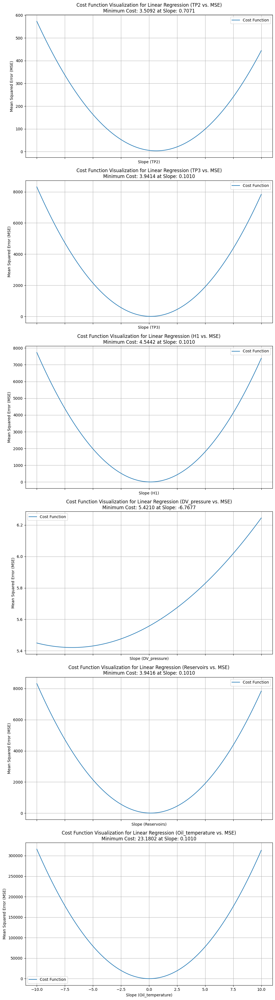

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer

if np.isnan(y).any():
    imputer = SimpleImputer(strategy='mean')
    y = imputer.fit_transform(y.values.reshape(-1, 1)).flatten()

column_names = X.columns
cost_values_dict = {}
for feature_name in column_names:

    feature_values = X[feature_name].values.reshape(-1, 1)


    if np.isnan(feature_values).any():
        imputer = SimpleImputer(strategy='mean')
        feature_values = imputer.fit_transform(feature_values).flatten()
    cost_values = []
    slope_values = []
    slopes = np.linspace(-10, 10, 100)
    for slope in slopes:
        model = LinearRegression(fit_intercept=True)
        model.coef_ = np.array([slope])
        model.intercept_ = 0.0
        y_pred = model.predict(feature_values.reshape(-1, 1))
        cost = mean_squared_error(y, y_pred)
        cost_values.append(cost)
        slope_values.append(slope)
    min_cost = min(cost_values)
    min_slope = slope_values[cost_values.index(min_cost)]
    cost_values_dict[feature_name] = (slope_values, cost_values, min_slope, min_cost)
fig, axes = plt.subplots(len(column_names), 1, figsize=(10, 6 * len(column_names)), sharex=True)

for i, feature_name in enumerate(column_names):
    slope_values, cost_values, min_slope, min_cost = cost_values_dict[feature_name]
    axes[i].plot(slope_values, cost_values, label='Cost Function')
    axes[i].set_xlabel(f'Slope ({feature_name})')
    axes[i].set_ylabel('Mean Squared Error (MSE)')
    axes[i].set_title(f'Cost Function Visualization for Linear Regression ({feature_name} vs. MSE)\n'
                     f'Minimum Cost: {min_cost:.4f} at Slope: {min_slope:.4f}')
    axes[i].legend()
    axes[i].grid(True)

plt.tight_layout()
plt.show()


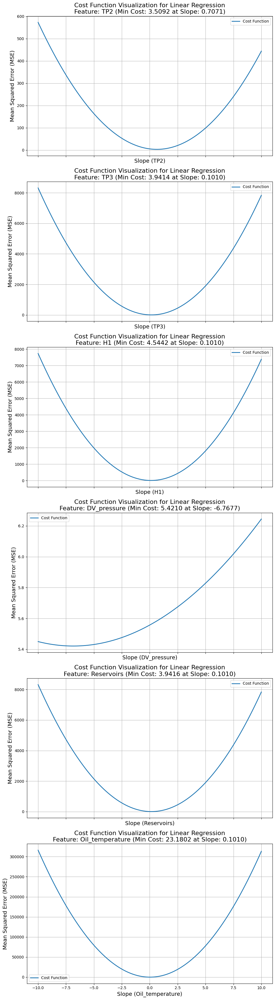

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer
if np.isnan(y).any():
    imputer = SimpleImputer(strategy='mean')
    y = imputer.fit_transform(y.values.reshape(-1, 1)).flatten()
column_names = X.columns

cost_values_dict = {}

for feature_name in column_names:
    feature_values = X[feature_name].values.reshape(-1, 1)
    if np.isnan(feature_values).any():
        imputer = SimpleImputer(strategy='mean')
        feature_values = imputer.fit_transform(feature_values).flatten()


    cost_values = []
    slope_values = []


    slopes = np.linspace(-10, 10, 100)


    for slope in slopes:
        model = LinearRegression(fit_intercept=True)
        model.coef_ = np.array([slope])
        model.intercept_ = 0.0
        y_pred = model.predict(feature_values.reshape(-1, 1))
        cost = mean_squared_error(y, y_pred)
        cost_values.append(cost)
        slope_values.append(slope)


    min_cost = min(cost_values)
    min_slope = slope_values[cost_values.index(min_cost)]
    cost_values_dict[feature_name] = (slope_values, cost_values, min_slope, min_cost)
fig, axes = plt.subplots(len(column_names), 1, figsize=(10, 6 * len(column_names)), sharex=True)

for i, feature_name in enumerate(column_names):
    slope_values, cost_values, min_slope, min_cost = cost_values_dict[feature_name]
    axes[i].plot(slope_values, cost_values, label='Cost Function', linewidth=2)
    axes[i].set_xlabel(f'Slope ({feature_name})', fontsize=14)
    axes[i].set_ylabel('Mean Squared Error (MSE)', fontsize=14)
    axes[i].set_title(f'Cost Function Visualization for Linear Regression\n'
                     f'Feature: {feature_name} (Min Cost: {min_cost:.4f} at Slope: {min_slope:.4f})', fontsize=16)
    axes[i].legend()
    axes[i].grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer
if np.isnan(y).any():
    imputer = SimpleImputer(strategy='mean')
    y = imputer.fit_transform(y.values.reshape(-1, 1)).flatten()
column_names = X.columns
cost_values_dict = {}
for feature_name in column_names:

    feature_values = X[feature_name].values.reshape(-1, 1)  # Reshape to a 2D array

    if np.isnan(feature_values).any():
        imputer = SimpleImputer(strategy='mean')
        feature_values = imputer.fit_transform(feature_values).flatten()

    cost_values = []
    slope_values = []
    slopes = np.linspace(-10, 10, 100)
    for slope in slopes:
        model = LinearRegression(fit_intercept=True)
        model.coef_ = np.array([slope])
        model.intercept_ = 0.0
        y_pred = model.predict(feature_values.reshape(-1, 1))
        cost = mean_squared_error(y, y_pred)
        cost_values.append(cost)
        slope_values.append(slope)
    min_cost = min(cost_values)
    cost_values_dict[feature_name] = (slope_values, cost_values, min_slope, min_cost)
fig, axes = plt.subplots(len(column_names), 1, figsize=(10, 6 * len(column_names)), sharex=True)

for i, feature_name in enumerate(column_names):
    slope_values, cost_values, min_slope, min_cost = cost_values_dict[feature_name]
    axes[i].plot(slope_values, cost_values, label='Cost Function', linewidth=2)
    axes[i].set_xlabel(f'Slope ({feature_name})', fontsize=14)
    axes[i].set_ylabel('Mean Squared Error (MSE)', fontsize=14)
    axes[i].set_title(f'Cost Function Visualization for Linear Regression\n'
                     f'Feature: {feature_name} (Min Cost: {min_cost:.4f} at Slope: {min_slope:.4f})', fontsize=16)
    axes[i].legend()
    axes[i].grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import ParameterGrid
numeric_columns = df.select_dtypes(include=[np.number]).columns
imputer = SimpleImputer(strategy='mean')
df[numeric_columns] = imputer.fit_transform(df[numeric_columns])
scaler = StandardScaler()
df[numeric_columns] = scaler.fit_transform(df[numeric_columns])
param_grid = {
    'learning_rate': [0.001, 0.01, 0.1, 0.5],
    'epochs': [50, 100, 200]
}

best_params = None
best_cost = float('inf')
for params in ParameterGrid(param_grid):
    learning_rate = params['learning_rate']
    epochs = params['epochs']

    cost_history_dict = {}

    for column in numeric_columns:
        slope = 0
        intercept = 0

        cost_history = []

        for epoch in range(epochs):
            feature_values = df[column].values
            y = df['Motor_current'].values
            y_pred = slope * feature_values + intercept
            gradient_slope = (-2 / len(y)) * np.dot(feature_values, (y - y_pred))
            gradient_intercept = (-2 / len(y)) * np.sum(y - y_pred)
            slope -= learning_rate * gradient_slope
            intercept -= learning_rate * gradient_intercept
            cost = mean_squared_error(y, slope * feature_values + intercept)
            cost_history.append(cost)

        cost_history_dict[column] = cost_history
    total_cost = sum(cost_history_dict[column][-1] for column in numeric_columns)

    if total_cost < best_cost:
        best_cost = total_cost
        best_params = params
print("Best Hyperparameters:", best_params)
print("Best Total Cost:", best_cost)


Best Hyperparameters: {'epochs': 50, 'learning_rate': 0.5}
Best Total Cost: 12.487748952969223


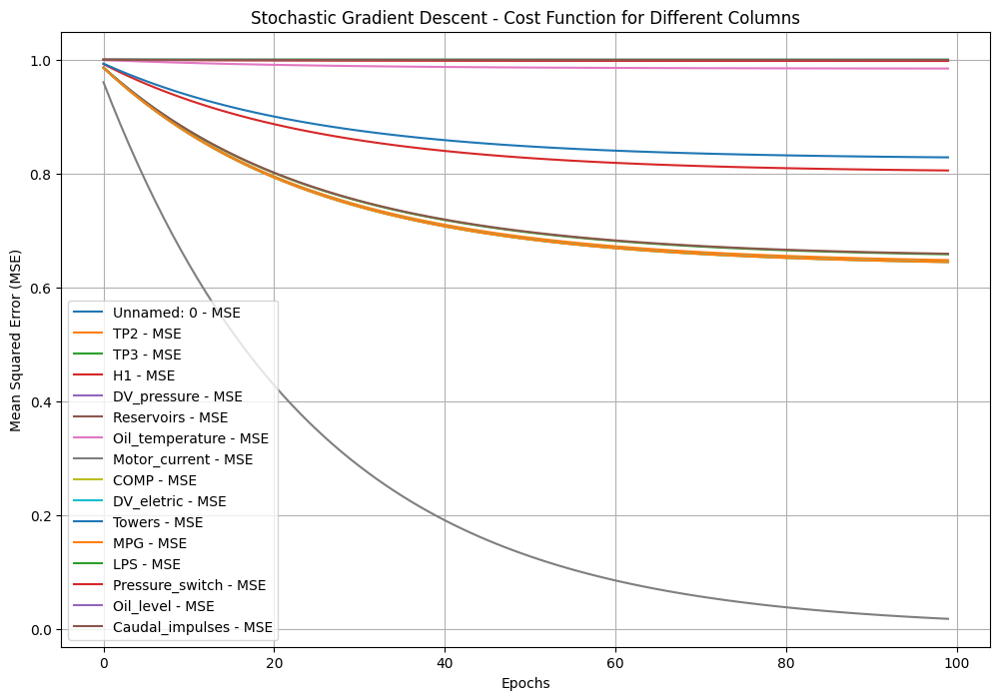

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
non_numeric_columns = df.select_dtypes(exclude=[np.number]).columns
if 'date_column' in non_numeric_columns:
    df['date_column'] = pd.to_datetime(df['date_column'])
    df['year'] = df['date_column'].dt.year
    df['month'] = df['date_column'].dt.month
    df['day'] = df['date_column'].dt.day
numeric_columns = df.select_dtypes(include=[np.number]).columns
imputer = SimpleImputer(strategy='mean')
df[numeric_columns] = imputer.fit_transform(df[numeric_columns])
scaler = StandardScaler()
df[numeric_columns] = scaler.fit_transform(df[numeric_columns])
learning_rate = 0.01
epochs = 100
cost_history_dict = {}
slope_history_dict = {}
intercept_history_dict = {}
for column in numeric_columns:
    slope = 0
    intercept = 0
    cost_history = []
    slope_history = []
    intercept_history = []

    for epoch in range(epochs):
        feature_values = df[column].values
        y = df['Motor_current'].values
        y_pred = slope * feature_values + intercept
        gradient_slope = (-2 / len(y)) * np.dot(feature_values, (y - y_pred))
        gradient_intercept = (-2 / len(y)) * np.sum(y - y_pred)
        slope -= learning_rate * gradient_slope
        intercept -= learning_rate * gradient_intercept
        cost = mean_squared_error(y, slope * feature_values + intercept)
        cost_history.append(cost)
        slope_history.append(slope)
        intercept_history.append(intercept)

    # Store the cost and parameter values in dictionaries
    cost_history_dict[column] = cost_history
    slope_history_dict[column] = slope_history
    intercept_history_dict[column] = intercept_history

# Plot cost function for each column
plt.figure(figsize=(12, 8))
for column in numeric_columns:
    plt.plot(range(len(cost_history_dict[column])), cost_history_dict[column], label=f'{column} - MSE')

plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Stochastic Gradient Descent - Cost Function for Different Columns')
plt.legend()
plt.grid(True)
plt.show()
